# Inductive Model - Hops

This notebooks shows how to load an inductive model saved with pytorh, and use it to interactively evaluate unseen graphs with this model in Grasshopper through hops using the [ghhops-server-py](https://github.com/mcneel/compute.rhino3d/tree/7.x/src/ghhops-server-py) workflow.

Authors: David Leon and Dai Kandil

## **Dependencies**

This next cell installs the necesary dependencies to run the whole thing. It usually takes about 10 minutes to run ☕

!! After it has installed, remember that you will have to run it again if you let the runtime timeout after 30 minutes.

In [ ]:
!pip install ghhops-server==1.5.2 pyngrok dgl #may take few minutes (~10m)

## Import libraries

In [ ]:
#import modules
%matplotlib inline
import numpy
import rhino3dm
import torch
import torch.nn as nn
import torch.nn.functional as F
import dgl
from dgl.nn import SAGEConv

import json
import math
import networkx as nx

import matplotlib.pyplot as plt
from flask import Flask
import ghhops_server as hs
from pyngrok import ngrok
import threading

#**Hops Workflow**


##Prepare the imported graph for prediction

We will need to preprocess the graphs we want to predict their labels, in the same way we did for the graphs we used for training the model.

##Load the trained model

In [ ]:
!pip install karateclub
!pip install node2vec
!pip install dgl
!pip install networkx==2.8.4
!pip install adjustText

In [3]:
import networkx as nx
import random
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.manifold import TSNE
import dgl
from dgl.nn import GraphConv
import math
import time
from tqdm import tqdm
import copy
from collections import Counter
from __future__ import division
from __future__ import print_function
from dgl.nn import SAGEConv
import sklearn.linear_model as lm
import sklearn.metrics as skm
import itertools
import scipy.sparse as sp
import dgl.function as fn
from sklearn.metrics import roc_auc_score
import torch
import scipy.sparse as sp
import torch
import torch.nn as nn
import torch.nn.functional as F
import sklearn

In [4]:
import numpy as np
import networkx as nx
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import dgl
from dgl.nn import SAGEConv
from sklearn.preprocessing import LabelEncoder


In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
# Load the model
model = SAGE(in_feats=8, hid_feats=5, out_feats=4)
model_path="/content/drive/MyDrive/GraphML_Satellite_Australia/inductive_node_classifier2"
model.load_state_dict(torch.load(model_path))

# Print the model
print(model)


SAGE(
  (conv1): SAGEConv(
    (feat_drop): Dropout(p=0.0, inplace=False)
    (fc_neigh): Linear(in_features=8, out_features=5, bias=False)
    (fc_self): Linear(in_features=8, out_features=5, bias=True)
  )
  (conv2): SAGEConv(
    (feat_drop): Dropout(p=0.0, inplace=False)
    (fc_neigh): Linear(in_features=5, out_features=4, bias=False)
    (fc_self): Linear(in_features=5, out_features=4, bias=True)
  )
)


Then, define the same class that you used to train the model

In [9]:
from os import walk
import pandas as pd
from natsort import natsorted

folder_path='/content/drive/MyDrive/GraphML_Satellite_Australia/CSVs_TEST/05'
paths = next(walk(folder_path), (None, None, []))[2]

paths = natsorted(paths)

all_graphs_nodes=[]
all_graphs_edges=[]
for i in paths:
  if "nodelist.csv" in i:
    graphs_nodes=pd.read_csv(folder_path+'/'+i)
    all_graphs_nodes.append(graphs_nodes)
  elif "edgelist.csv" in i:
    graphs_edges=pd.read_csv(folder_path+'/'+i)
    all_graphs_edges.append(graphs_edges)


In [10]:
all_graphs_nodes = [df.drop('Eigenvector', axis=1, inplace=False) if 'Eigenvector' in df.columns else df for df in all_graphs_nodes]


In [11]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
def average_neighbour_resistance(node, graph_edges):
    neighbours = graph_edges[(graph_edges['Node1'] == node) | (graph_edges['Node2'] == node)].values.flatten()
    neighbours = [x for x in neighbours if x != node]  # remove the node itself
    return graph_edges.loc[(graph_edges['Node1'].isin(neighbours) & (graph_edges['Node2'] == node)) |
                           (graph_edges['Node2'].isin(neighbours) & (graph_edges['Node1'] == node)), 'Resistance'].mean()

for g_nodes, g_edges in zip(all_graphs_nodes, all_graphs_edges):
    g_edges['Resistance'] = scaler.fit_transform(g_edges[['Resistance']])
    g_nodes['avg_neighbour_resistance'] = g_nodes['Node'].apply(lambda x: average_neighbour_resistance(x, g_edges))


In [12]:
all_graphs_nodes[1]

,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance
0,0,4.444444,1,0.000604,0.028169,0.101063,0.006679,0.000000,0.077778
1,1,3.750000,1,0.024145,0.042254,0.116352,0.008943,0.333333,0.088889
2,2,4.722222,1,0.003924,0.042254,0.112204,0.007506,0.000000,0.177778
3,3,4.583333,1,0.000805,0.042254,0.112620,0.007311,0.666667,0.133333
4,4,4.722222,2,0.076660,0.098592,0.132173,0.015542,0.190476,0.126984
...,...,...,...,...,...,...,...,...,...
67,67,3.650585,19,0.068813,0.098592,0.111713,0.028691,0.238095,0.172698
68,68,1.805556,1,0.000000,0.028169,0.094037,0.008576,1.000000,0.393333
69,69,3.611111,1,0.000000,0.028169,0.094037,0.006702,1.000000,0.393333
70,70,5.694444,1,0.000000,0.028169,0.095701,0.007678,1.000000,0.200000


In [13]:
all_edited_weights=[]
for  e_csv in all_graphs_edges:
  sub_ew=[]
  for j in range(len(e_csv["weight"])):
    e_w=e_csv["weight"].iloc[j] /2 +   e_csv["Resistance"].iloc[j] /2
    sub_ew.append(e_w)
  all_edited_weights.append(sub_ew)


In [14]:
for e_csv,e_w in zip(all_graphs_edges,all_edited_weights):
  e_csv['new_weight'] = e_w

In [15]:
all_graphs_edges[1]

,Node1,Node2,weight,Resistance,new_weight
0,0,1,0.692308,0.111111,0.401709
1,0,2,0.849057,0.044444,0.446751
2,1,3,0.652174,0.133333,0.392754
3,1,4,0.918367,0.022222,0.470295
4,2,4,0.652174,0.133333,0.392754
...,...,...,...,...,...
174,67,70,0.652174,0.133333,0.392754
175,67,71,0.652174,0.133333,0.392754
176,67,68,0.529412,0.222222,0.375817
177,67,69,0.529412,0.222222,0.375817


In [7]:
class SAGE(nn.Module):
    def __init__(self, in_feats, hid_feats, out_feats):
        super().__init__()
        self.conv1 = SAGEConv(in_feats=in_feats, out_feats=hid_feats, aggregator_type='mean')
        self.conv2 = SAGEConv(in_feats=hid_feats, out_feats=out_feats, aggregator_type='mean')

    def forward(self, graph, inputs,edge_weights):
        # inputs are features of nodes
        h = self.conv1(graph, inputs)
        h = F.relu(h)
        h = self.conv2(graph, h)
        return h

In [16]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

def average_neighbour_resistance(node, graph_edges):
    neighbours = graph_edges[(graph_edges['Node1'] == node) | (graph_edges['Node2'] == node)].values.flatten()
    neighbours = [x for x in neighbours if x != node]  # remove the node itself
    return graph_edges.loc[(graph_edges['Node1'].isin(neighbours) & (graph_edges['Node2'] == node)) |
                           (graph_edges['Node2'].isin(neighbours) & (graph_edges['Node1'] == node)), 'Resistance'].mean()

for g_nodes, g_edges in zip(all_graphs_nodes, all_graphs_edges):
    g_edges['Resistance'] = scaler.fit_transform(g_edges[['Resistance']])
    g_nodes['avg_neighbour_resistance'] = g_nodes['Node'].apply(lambda x: average_neighbour_resistance(x, g_edges))

# Add the new attribute to the list
attributes = ['weight', 'num_nodes', 'Betweenness', 'Degree', 'Closeness', 'PageRank', 'Clustering', 'avg_neighbour_resistance']


In [17]:
all_predicted_labels = []

for i, (nodes_df, edges_df) in enumerate(zip(all_graphs_nodes, all_graphs_edges)):
    print(f"Processing graph {i + 1}")
    # Create NetworkX Graph from the edgelist
    edge_index = edges_df[['Node1', 'Node2']].values.T
    edge_weight = edges_df['new_weight'].values
    edge_attr = dict(zip([(i, j) for i, j in edge_index.T], edge_weight))
    nx_graph = nx.from_edgelist(edge_index.T)

    # Set 'new_weight' edge attribute
    nx.set_edge_attributes(nx_graph, edge_attr, 'new_weight')

    # Convert NetworkX Graph to DGL Graph
    g = dgl.from_networkx(nx_graph)
    g = dgl.to_bidirected(g)  # Create a bidirectional graph

    # Set node features
    nodes_df = nodes_df.set_index('Node')  # Make sure that 'Node' is the index
    for attr in attributes:
        g.ndata[attr] = torch.tensor(nodes_df.loc[g.nodes().numpy(), attr].values, dtype=torch.float32)
    g.ndata['feat'] = torch.cat([g.ndata[attr].view(-1, 1) for attr in attributes], 1)

    # Set edge features
    e_features = list(nx.get_edge_attributes(nx_graph, 'new_weight').values())
    e_features = e_features + e_features  # repeat edge features for reverse edges
    g.edata['new_weight'] = torch.tensor(e_features, dtype=torch.float32)

    # Set the test node features
    test_node_features = g.ndata['feat']

    print("Attributes: ", attributes)
    print("Shape of test_node_features: ", test_node_features.shape)

    with torch.no_grad():
        e_weights = g.edata['new_weight']
        logits = model(g, test_node_features, e_weights)
        _, indices = torch.max(logits, dim=1)  # equivalent to argmax

        print(f"Predicted labels for graph {i + 1}: {indices.numpy()}")  # Add this line

        # Save the predicted labels
        all_predicted_labels.append(indices.numpy())


Processing graph 1
Attributes:  ['weight', 'num_nodes', 'Betweenness', 'Degree', 'Closeness', 'PageRank', 'Clustering', 'avg_neighbour_resistance']
Shape of test_node_features:  torch.Size([116, 8])
Predicted labels for graph 1: [0 0 0 0 1 0 0 0 0 0 3 2 0 0 2 1 0 1 0 0 0 0 3 3 1 1 2 0 0 0 2 0 0 2 1 1 1
 0 0 0 2 2 0 0 0 0 0 0 3 2 3 0 0 0 2 0 0 0 0 2 0 0 0 0 2 0 1 3 1 0 2 2 1 2
 3 2 3 0 2 0 0 2 0 0 2 0 3 0 1 2 0 0 3 0 2 0 0 2 3 1 2 0 0 0 3 0 2 0 3 2 3
 0 0 2 0 2]
Processing graph 2
Attributes:  ['weight', 'num_nodes', 'Betweenness', 'Degree', 'Closeness', 'PageRank', 'Clustering', 'avg_neighbour_resistance']
Shape of test_node_features:  torch.Size([72, 8])
Predicted labels for graph 2: [3 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 3 0 0 0 0 2 2 0 0 0 0 2 0 0 0
 0 0 1 3 0 1 0 0 0 0 0 0 0 0 2 0 0 2 0 0 2 1 0 0 1 3 0 1 0 1 3 1 1 0 0]
Processing graph 3
Attributes:  ['weight', 'num_nodes', 'Betweenness', 'Degree', 'Closeness', 'PageRank', 'Clustering', 'avg_neighbour_resistance']
Shape of te

/usr/local/lib/python3.10/dist-packages/dgl/backend/pytorch/tensor.py:449: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  assert input.numel() == input.storage().size(), (


Attributes:  ['weight', 'num_nodes', 'Betweenness', 'Degree', 'Closeness', 'PageRank', 'Clustering', 'avg_neighbour_resistance']
Shape of test_node_features:  torch.Size([172, 8])
Predicted labels for graph 9: [0 0 0 0 3 0 0 1 0 2 0 3 0 0 0 0 3 0 0 0 0 3 0 3 0 0 0 0 2 2 3 3 0 0 2 0 3
 0 0 2 0 0 3 0 3 0 3 0 0 0 0 0 3 3 3 0 2 0 3 0 0 2 0 2 0 0 0 0 0 2 0 0 3 3
 0 0 1 0 2 2 0 1 0 0 0 1 0 2 0 0 2 0 0 0 0 0 2 0 0 2 0 0 3 0 0 0 0 2 2 0 0
 0 0 3 0 2 3 0 2 3 0 0 0 0 3 2 2 0 0 0 3 0 0 0 2 0 0 0 3 0 3 0 0 0 0 0 0 3
 0 2 0 0 0 2 0 3 0 0 0 0 2 0 3 2 0 0 0 3 3 0 0 0]
Processing graph 10
Attributes:  ['weight', 'num_nodes', 'Betweenness', 'Degree', 'Closeness', 'PageRank', 'Clustering', 'avg_neighbour_resistance']
Shape of test_node_features:  torch.Size([121, 8])
Predicted labels for graph 10: [1 2 3 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0 0 0 0 0 0 0 0 0 2 0 0 0 0
 0 0 0 0 0 0 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0
 0 0 0 0 2 0 0 0 0 0 1 2 0 0 0 0 0 2 2 0 0 1 0 0 0 0 1 0 0 

In [18]:
print(len(all_graphs_nodes))
print(len(all_graphs_edges))


28
28


Define a funciton to use the model to evaluate unseen data:

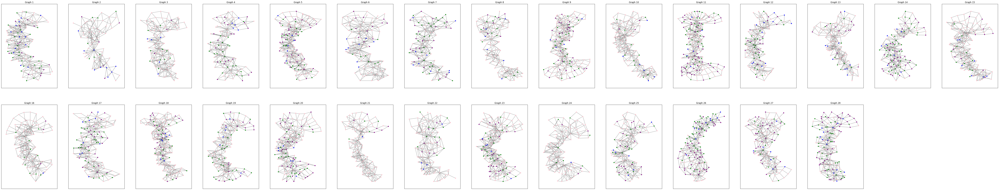

In [174]:
# Create a list to store the graphs
all_graphs = []

# Iterate over the node and edge dataframes to create graphs
for nodes_df, edges_df in zip(all_graphs_nodes, all_graphs_edges):
    edge_index = edges_df[['Node1', 'Node2']].values
    nx_graph = nx.from_edgelist(edge_index)
    all_graphs.append(nx_graph)

# Define the color map
color_map = {0: 'pink', 1: 'blue', 2: 'green', 3: 'purple'}

# Create a figure to plot the graphs
fig = plt.figure(figsize=(100, 100))

# Iterate over all predicted labels and corresponding graphs
for i, (g, labels) in enumerate(zip(all_graphs, all_predicted_labels)):
    colors_name = [color_map[label] for label in labels]

    ax = fig.add_subplot(10, 15, i+1)
    positions = nx.kamada_kawai_layout(g)
    nx.draw_networkx(g, pos=positions, node_color=colors_name, node_size=20, with_labels=False, arrowsize=2, edge_color='grey')
    ax.set_title(f'Graph {i+1}')


In [155]:
print(f'Number of nodes in graph {plot_ind+1}: {g.number_of_nodes()}')
print(f'Number of predicted labels for graph {plot_ind+1}: {len(predicted_labels)}')
print(f'Number of predicted colors for graph {plot_ind+1}: {len(predicted_colors)}')


Number of nodes in graph 1: 116
Number of predicted labels for graph 1: 134
Number of predicted colors for graph 1: 134


In [19]:
new_all_graphs_nodes = [] # List to store the new dataframes

# Iterate over the original dataframes and their corresponding labels
for df, labels in zip(all_graphs_nodes, all_predicted_labels):
    new_df = df.copy()  # Make a copy of the dataframe to avoid changing the original one
    # Iterate over the labels and apply the weight increase where the label is 1, 2 or 3
    for i in range(len(labels)):
        if labels[i] in [1, 2, 3]:
            new_df.loc[i, 'weight'] = new_df.loc[i, 'weight'] + new_df.loc[i, 'weight']*(labels[i]*0.1)
    new_all_graphs_nodes.append(new_df)

# Now you can access the new dataframes with increased weights like so:
print(new_all_graphs_nodes[1])


    Node    weight  num_nodes  Betweenness    Degree  Closeness  PageRank  \
0      0  5.777778          1     0.000604  0.028169   0.101063  0.006679   
1      1  4.500000          1     0.024145  0.042254   0.116352  0.008943   
2      2  4.722222          1     0.003924  0.042254   0.112204  0.007506   
3      3  4.583333          1     0.000805  0.042254   0.112620  0.007311   
4      4  4.722222          2     0.076660  0.098592   0.132173  0.015542   
..   ...       ...        ...          ...       ...        ...       ...   
67    67  4.745760         19     0.068813  0.098592   0.111713  0.028691   
68    68  1.986111          1     0.000000  0.028169   0.094037  0.008576   
69    69  3.972222          1     0.000000  0.028169   0.094037  0.006702   
70    70  5.694444          1     0.000000  0.028169   0.095701  0.007678   
71    71  5.138889          1     0.000000  0.028169   0.095701  0.007772   

    Clustering  avg_neighbour_resistance  
0     0.000000                  

In [ ]:
!pip install --upgrade matplotlib networkx
!pip install matplotlib==3.3.4 networkx==2.5


Processing modified graph 1...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,7.397260,1,0.000000,0.008696,0.765986,0.002478,0.000000,0.333333,0.004804
1,1,5.671233,5,0.040782,0.043478,1.025565,0.009305,0.300000,0.325490,0.038283
2,37,5.050881,42,0.205529,0.182609,1.373794,0.028157,0.185714,0.324556,0.243042
3,3,8.219178,1,0.017833,0.026087,0.726514,0.004492,0.666667,0.392157,0.030087
4,4,4.671233,1,0.011369,0.017391,0.924670,0.004474,1.000000,0.225490,0.007065
...,...,...,...,...,...,...,...,...,...,...
111,111,5.342466,1,0.012289,0.017391,0.999284,0.004235,0.000000,0.147059,0.001101
112,112,4.520548,1,0.000025,0.017391,0.877259,0.004675,0.000000,0.147059,0.000953
113,114,5.388128,6,0.013558,0.069565,0.933323,0.013922,0.357143,0.378922,0.003355
114,115,1.972603,1,0.000000,0.026087,0.916693,0.007760,0.666667,0.189542,0.001204


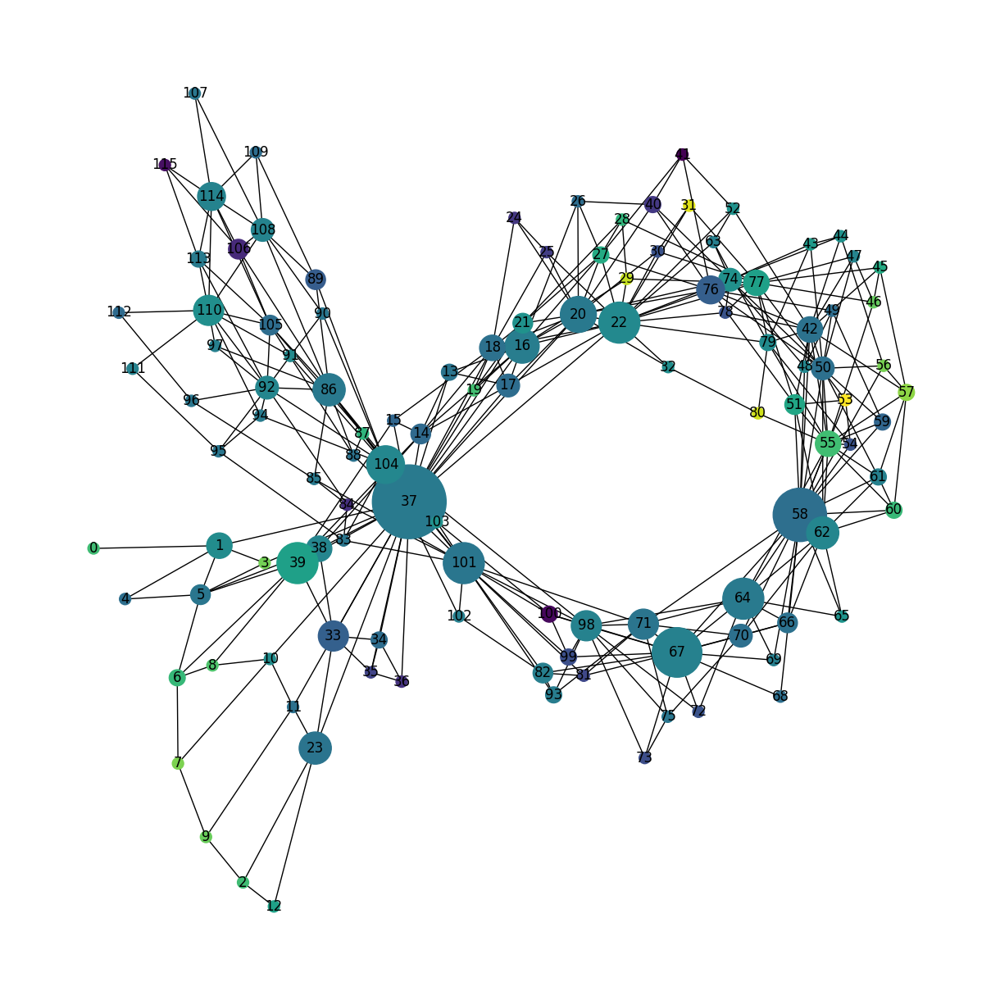

Processing modified graph 2...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,5.777778,1,0.000402,0.028169,1.045279,0.005322,0.000000,0.077778,0.002060
1,1,4.500000,1,0.026370,0.042254,1.171789,0.007626,0.333333,0.088889,0.002877
2,2,4.722222,1,0.000402,0.042254,1.045279,0.007181,0.000000,0.177778,0.013645
3,3,4.583333,1,0.001073,0.042254,1.065497,0.007529,0.666667,0.133333,0.004959
4,4,4.722222,2,0.101754,0.098592,1.201760,0.014740,0.190476,0.126984,0.016421
...,...,...,...,...,...,...,...,...,...,...
67,58,4.277778,2,0.000000,0.028169,0.809558,0.008133,1.000000,0.171111,0.019986
68,68,1.986111,1,0.000000,0.028169,0.730486,0.009762,1.000000,0.393333,0.018468
69,69,3.972222,1,0.000000,0.028169,0.730486,0.007989,1.000000,0.393333,0.018468
70,70,5.694444,1,0.000000,0.028169,0.780448,0.007734,1.000000,0.200000,0.007216


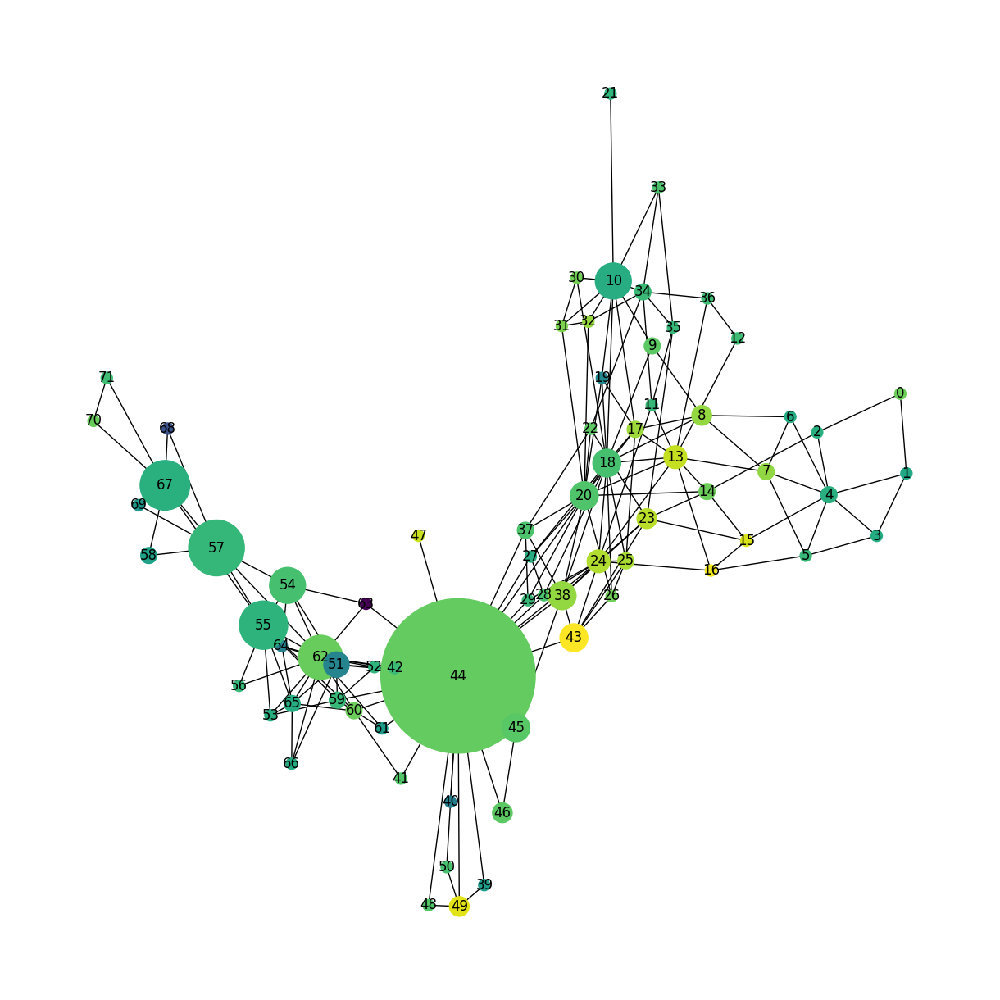

Processing modified graph 3...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,5.303030,1,0.000000,0.018692,1.824701,0.004980,0.000000,0.077640,0.000268
1,1,5.303030,1,0.022779,0.018692,1.824701,0.004623,0.000000,0.046584,0.000362
2,2,4.545455,1,0.000502,0.028037,1.931062,0.006743,0.333333,0.269151,0.001742
3,3,5.050505,3,0.042054,0.056075,2.185890,0.011166,0.200000,0.196687,0.002689
4,20,5.000000,2,0.000000,0.037383,1.071264,0.006592,0.333333,0.652174,0.012047
...,...,...,...,...,...,...,...,...,...,...
103,106,7.272727,2,0.000000,0.046729,1.513663,0.006797,0.500000,0.161491,0.085803
104,96,7.348485,2,0.011085,0.037383,1.794292,0.006511,0.666667,0.263975,0.051868
105,97,5.000000,4,0.066188,0.037383,1.568801,0.005460,0.500000,0.054348,0.058969
106,98,1.833333,1,0.000000,0.028037,1.391406,0.007532,1.000000,0.217391,0.034775


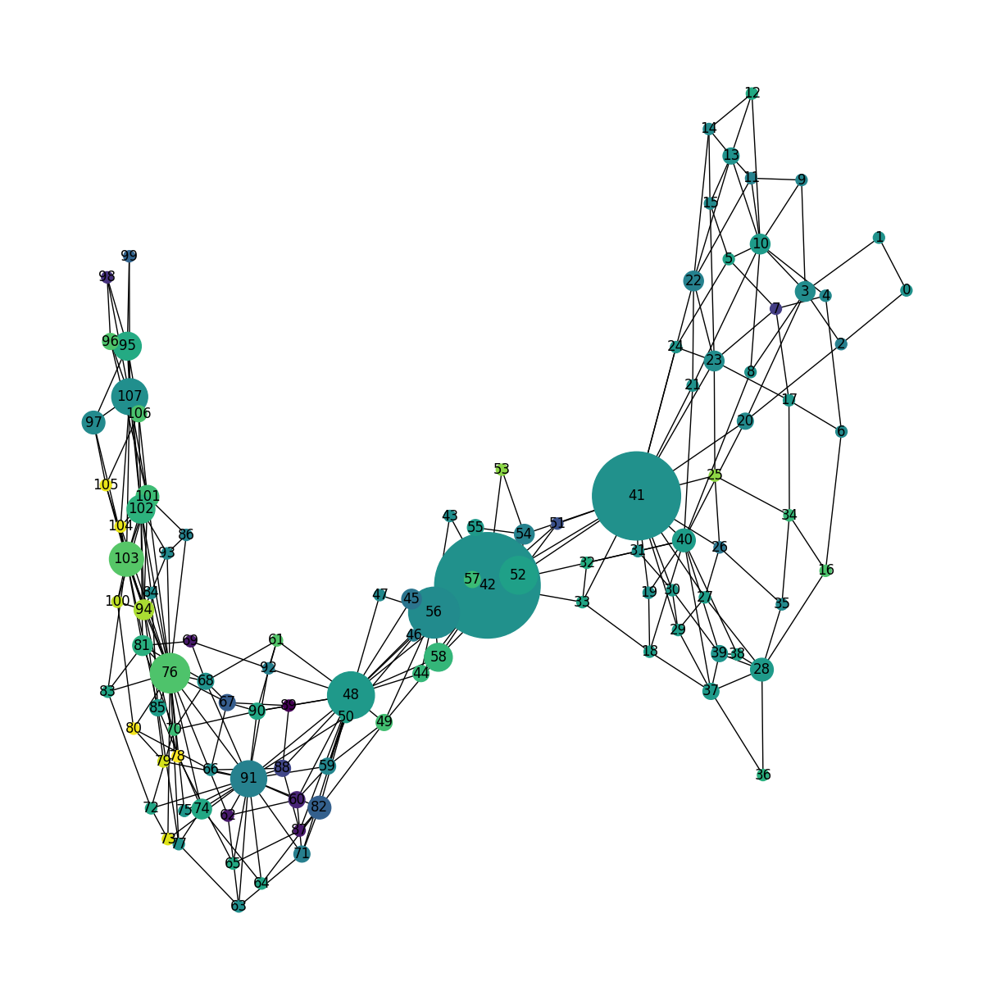

Processing modified graph 4...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,6.153846,1,0.000984,0.020619,1.308995,0.004607,1.000000,0.131579,0.004020
1,1,6.153846,3,0.026586,0.051546,1.308995,0.010712,0.200000,0.194737,0.016076
2,2,4.747253,1,0.000000,0.030928,1.158063,0.007547,0.666667,0.271930,0.015937
3,7,5.384615,1,0.023741,0.030928,1.422672,0.007909,0.333333,0.078947,0.005420
4,8,6.373626,1,0.000185,0.030928,1.422672,0.006842,0.000000,0.232456,0.009945
...,...,...,...,...,...,...,...,...,...,...
93,94,5.666667,6,0.000000,0.072165,0.835847,0.011654,0.047619,0.703008,0.020336
94,90,5.054945,1,0.000000,0.030928,1.198738,0.005373,0.000000,0.442982,0.012409
95,95,4.142857,1,0.001342,0.020619,1.127596,0.004845,0.000000,0.250000,0.008098
96,96,3.571429,1,0.012719,0.020619,1.451810,0.005236,0.000000,0.381579,0.005437


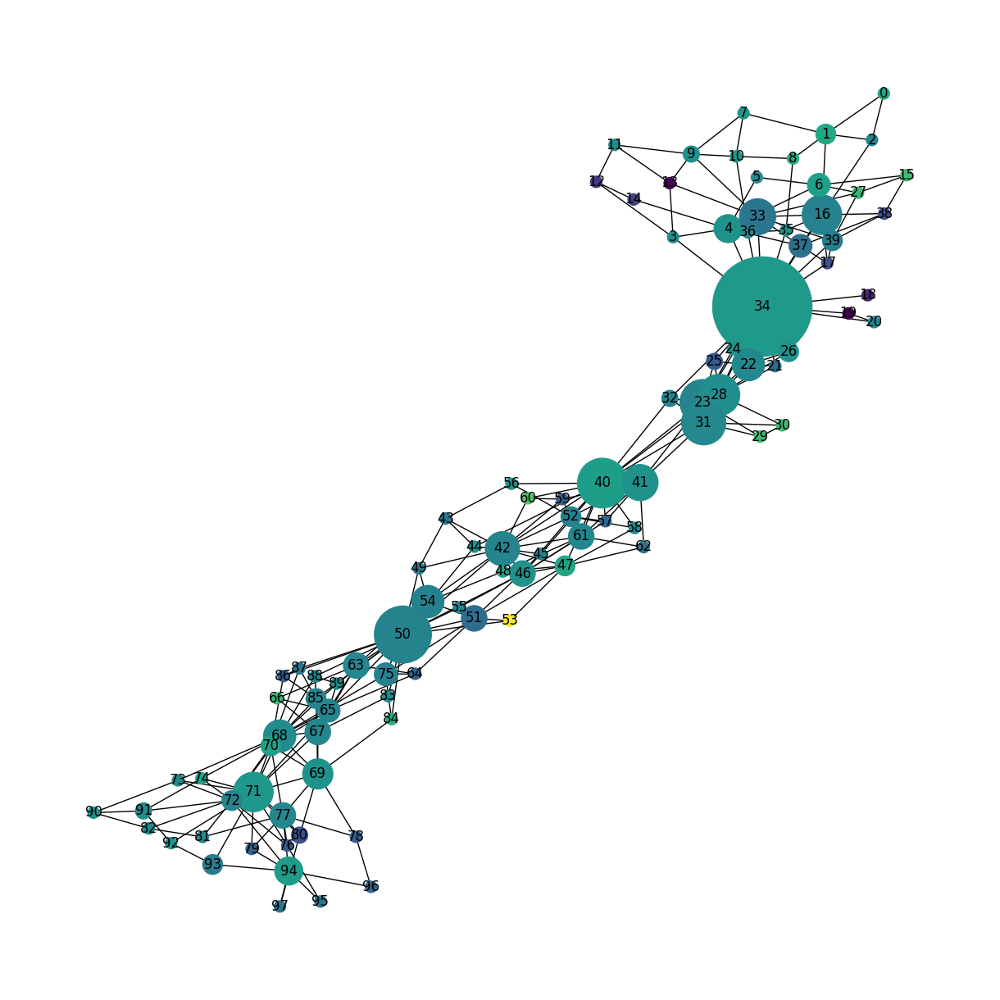

Processing modified graph 5...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,7.419355,1,0.000000,0.01250,0.640234,0.002850,0.000000,0.421053,0.000358
1,1,5.967742,1,0.011146,0.01875,0.711733,0.004153,0.000000,0.216374,0.001245
2,2,1.467742,1,0.000000,0.01875,0.718235,0.005268,0.000000,0.491228,0.001933
3,13,4.838710,1,0.003335,0.01875,0.748879,0.004058,0.333333,0.245614,0.001601
4,22,5.322581,1,0.021284,0.02500,0.854909,0.005480,0.000000,0.276316,0.007551
...,...,...,...,...,...,...,...,...,...,...
156,157,3.774194,1,0.000249,0.01875,0.581848,0.005784,0.000000,0.403509,0.000519
157,158,3.251613,5,0.010222,0.03125,0.638691,0.012276,0.400000,0.136842,0.001620
158,159,7.258065,1,0.000000,0.01875,0.602449,0.005853,0.666667,0.257310,0.000936
159,160,5.483871,1,0.009711,0.01875,0.657714,0.005078,0.333333,0.192982,0.000850


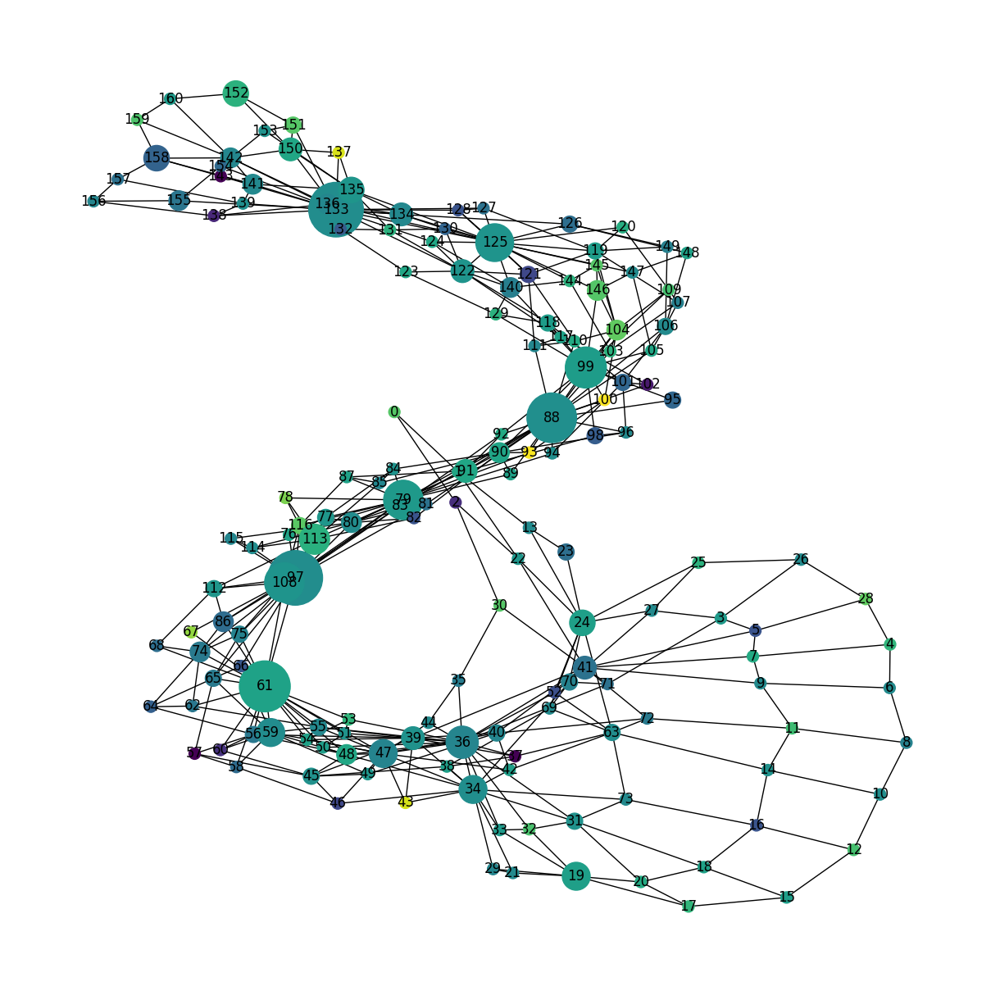

Processing modified graph 6...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,6.800000,1,0.000000,0.009259,1.361917,0.002407,0.000000,0.016667,0.001082
1,1,6.853333,10,0.235861,0.064815,1.393249,0.014188,0.142857,0.164286,0.010273
2,15,2.773333,2,0.197782,0.055556,1.539192,0.013420,0.266667,0.355556,0.014112
3,16,5.200000,3,0.029318,0.083333,1.010763,0.023140,0.250000,0.462963,0.024364
4,11,5.093333,5,0.121418,0.092593,1.348876,0.020015,0.133333,0.288333,0.015905
...,...,...,...,...,...,...,...,...,...,...
104,100,5.555556,6,0.003739,0.037037,1.065439,0.004721,1.000000,0.216667,0.014881
105,99,4.829630,9,0.000000,0.064815,1.148325,0.007495,0.523810,0.209524,0.022342
106,96,6.800000,1,0.002365,0.037037,0.991129,0.004517,0.500000,0.187500,0.013227
107,98,5.037037,9,0.024344,0.064815,0.912933,0.007537,0.523810,0.242857,0.023192


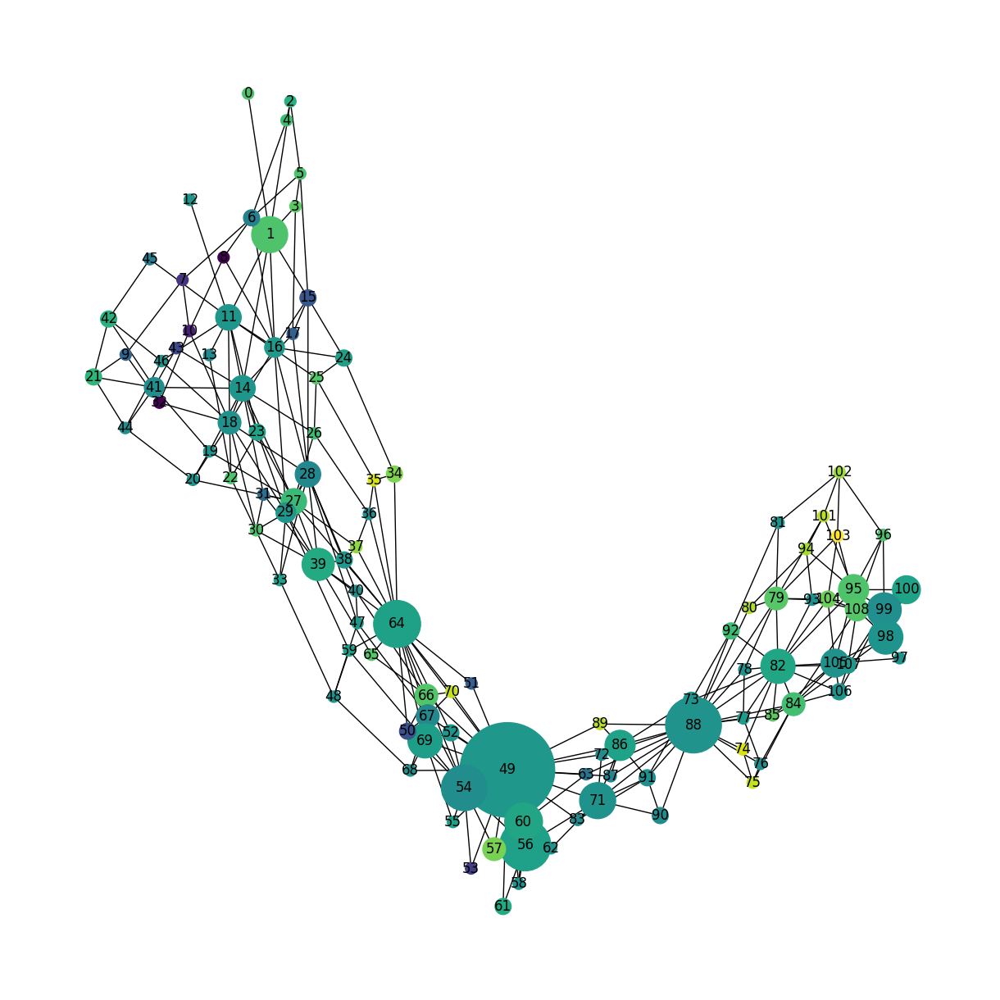

Processing modified graph 7...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,4.240964,2,0.000000,0.020833,1.169781,0.004393,1.000000,0.111111,0.004696
1,1,5.180723,1,0.024211,0.031250,1.214409,0.006165,0.666667,0.116402,0.014668
2,2,5.108434,3,0.005702,0.062500,1.094423,0.012278,0.333333,0.187831,0.023521
3,50,5.286145,4,0.154806,0.104167,1.462212,0.020866,0.222222,0.293016,0.085600
4,3,5.064257,3,0.047187,0.072917,1.237012,0.013422,0.285714,0.147392,0.020006
...,...,...,...,...,...,...,...,...,...,...
92,82,6.265060,2,0.000000,0.031250,1.107652,0.004518,0.666667,0.338624,0.014003
93,91,4.698795,1,0.000768,0.031250,1.372300,0.004518,0.666667,0.111111,0.012063
94,92,4.578313,2,0.000439,0.031250,1.269202,0.004384,0.666667,0.058201,0.012870
95,95,3.313253,1,0.000000,0.020833,1.213191,0.003852,1.000000,0.166667,0.012288


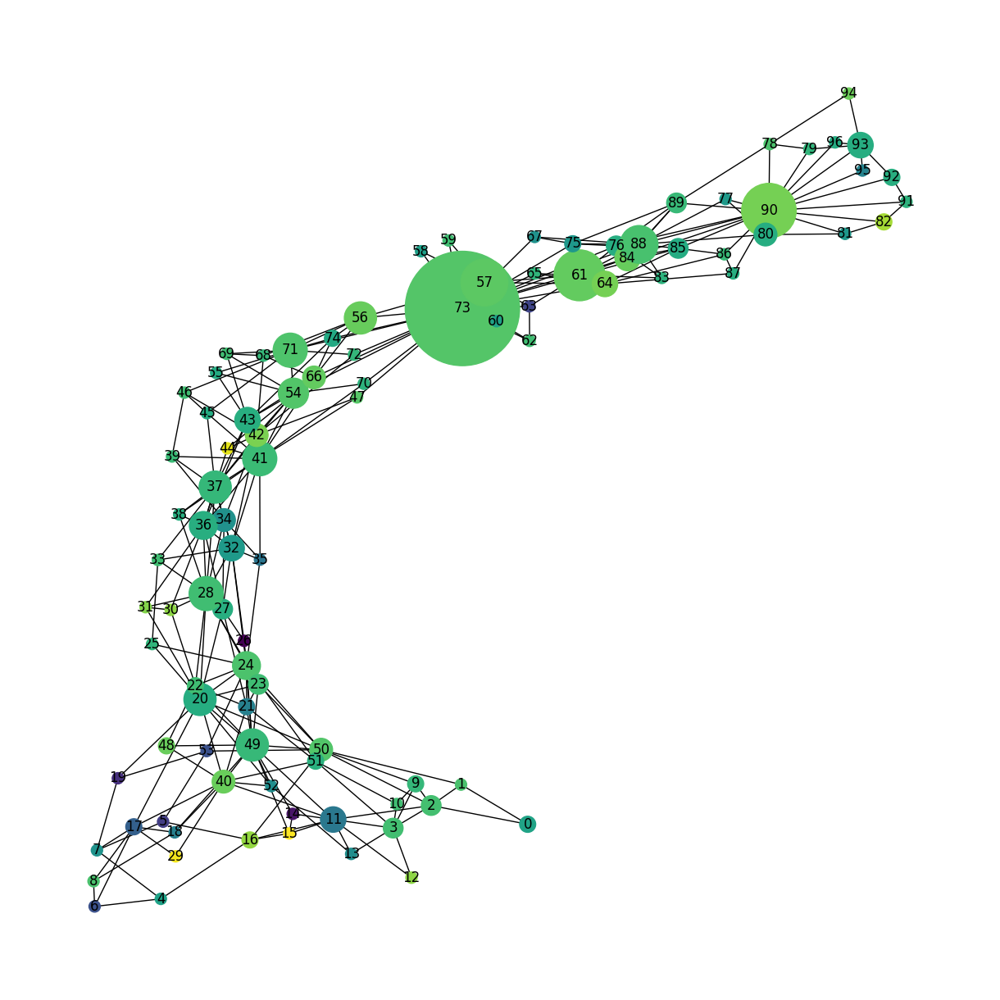

Processing modified graph 8...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,0.312500,1,0.000000,0.009709,1.153463,0.011691,0.000000,0.018519,0.000472
1,1,4.570312,6,0.044103,0.077670,1.178390,0.117991,0.178571,0.317130,0.003888
2,2,0.000000,1,0.000000,0.019417,1.153463,0.166302,0.000000,0.453704,0.002327
3,40,4.583333,3,0.066887,0.087379,1.178390,0.038596,0.222222,0.539095,0.013003
4,8,6.875000,1,0.000000,0.019417,1.058219,0.016890,1.000000,0.435185,0.000920
...,...,...,...,...,...,...,...,...,...,...
99,92,4.843750,1,0.000000,0.029126,1.058622,0.000016,1.000000,0.290123,0.119437
100,93,7.187500,1,0.000000,0.029126,0.980952,0.000016,1.000000,0.197531,0.117309
101,94,3.910156,4,0.000420,0.038835,1.058622,0.000021,0.833333,0.240741,0.134396
102,95,9.218750,1,0.000000,0.019417,0.807726,0.000010,1.000000,0.509259,0.068379


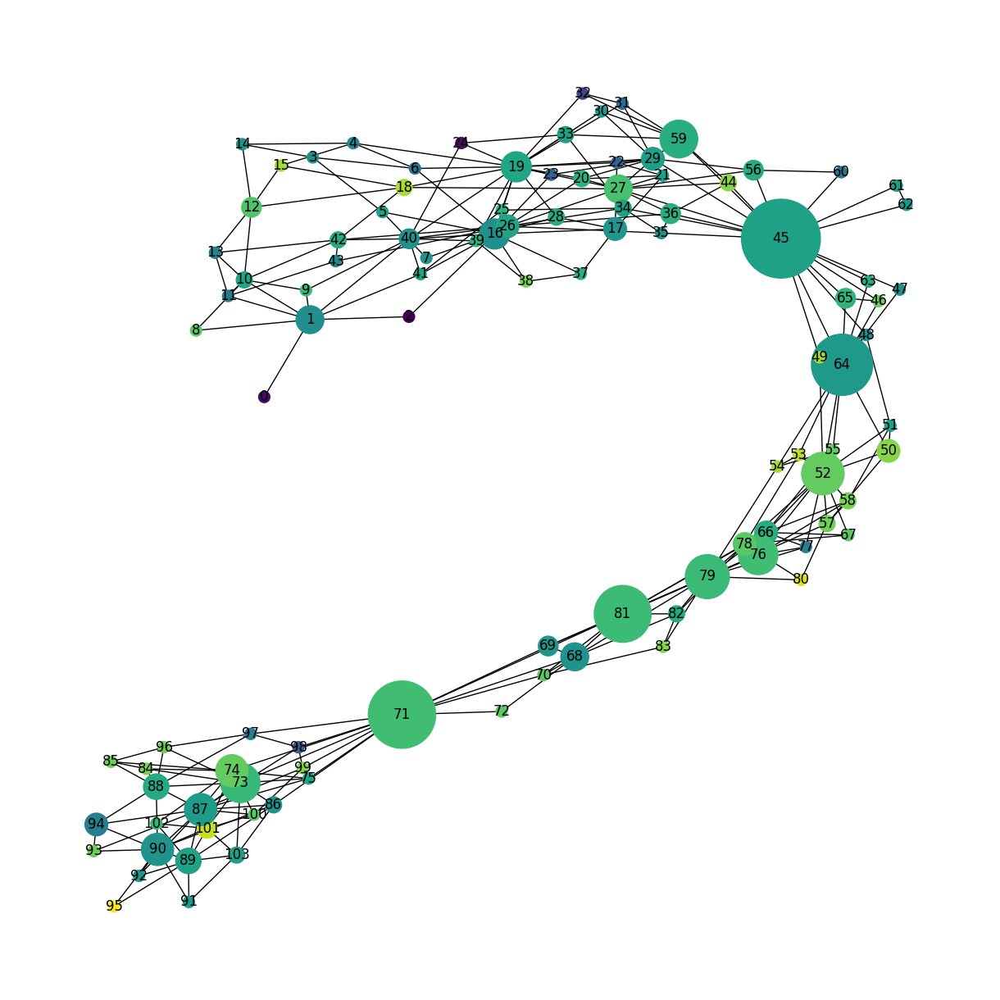

Processing modified graph 9...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,7.60,1,0.000097,0.011696,0.790751,0.000346,0.000000,0.150000,0.000131
1,1,5.60,1,0.003895,0.017544,0.825887,0.000513,0.000000,0.233333,0.000106
2,2,8.00,1,0.008191,0.017544,0.822313,0.000756,0.000000,0.200000,0.000990
3,3,8.40,1,0.000000,0.017544,0.644675,0.000497,0.000000,0.500000,0.000083
4,14,6.40,1,0.024304,0.023392,0.898345,0.000967,0.000000,0.150000,0.000603
...,...,...,...,...,...,...,...,...,...,...
167,160,1.44,1,0.000722,0.017544,0.840501,0.000051,0.333333,0.150000,0.001344
168,161,5.60,1,0.037910,0.017544,0.912730,0.000044,0.000000,0.100000,0.001685
169,162,1.04,1,0.029119,0.017544,0.912730,0.000051,0.000000,0.100000,0.000977
170,163,4.80,1,0.008970,0.017544,0.912730,0.000042,0.333333,0.133333,0.000832


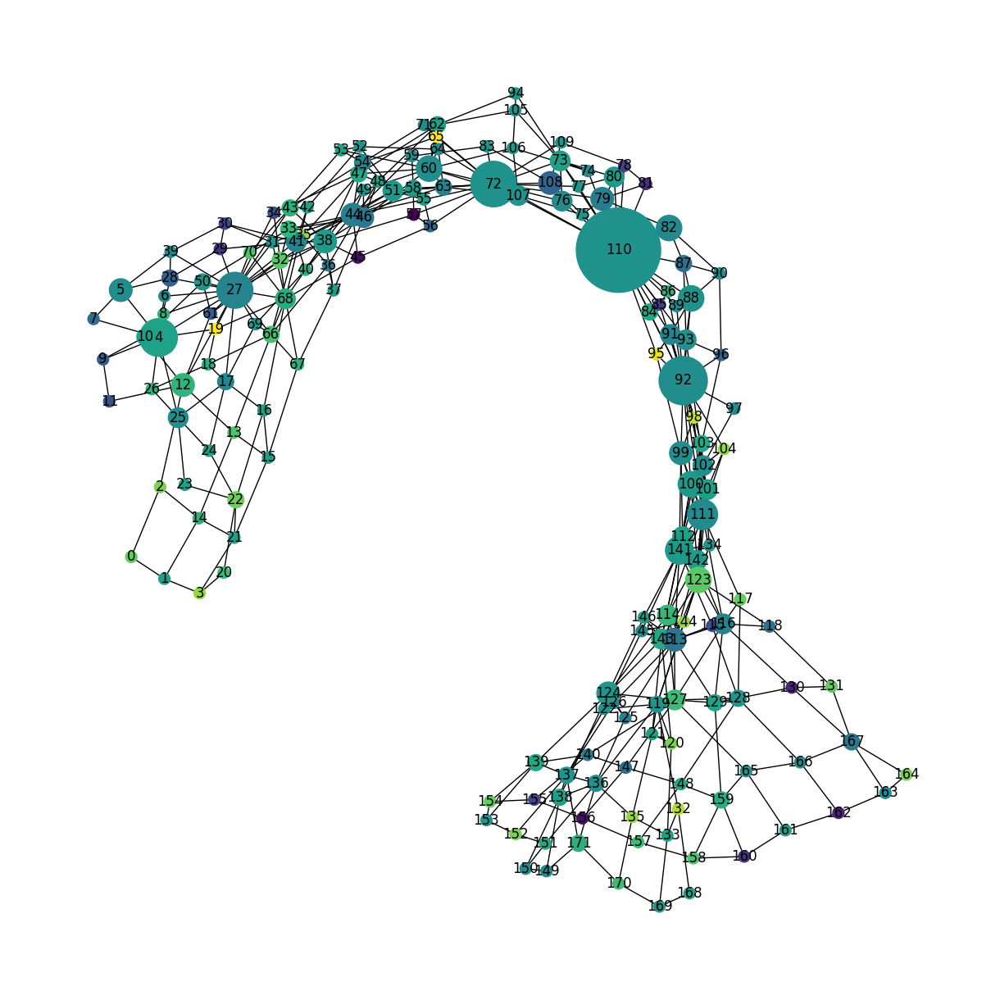

Processing modified graph 10...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,3.826087,1,0.000000,0.016667,0.861982,0.005635,1.000000,0.114035,0.001990
1,1,4.521739,1,0.003045,0.025000,0.888635,0.007193,0.666667,0.087719,0.002529
2,2,5.746377,2,0.035778,0.050000,1.023309,0.012353,0.266667,0.222222,0.012965
3,7,7.101449,1,0.005564,0.033333,0.946163,0.007912,0.333333,0.228070,0.005347
4,36,7.603865,6,0.170733,0.108333,1.742764,0.018905,0.128205,0.191633,0.073788
...,...,...,...,...,...,...,...,...,...,...
116,120,7.536232,1,0.000840,0.033333,0.986529,0.006425,0.666667,0.380702,0.002611
117,105,4.637681,1,0.011571,0.033333,1.075336,0.008222,0.666667,0.254386,0.002368
118,106,2.956522,1,0.002439,0.033333,0.909768,0.008512,0.500000,0.328947,0.001943
119,107,6.231884,1,0.005916,0.033333,0.906753,0.007334,0.500000,0.185088,0.001590


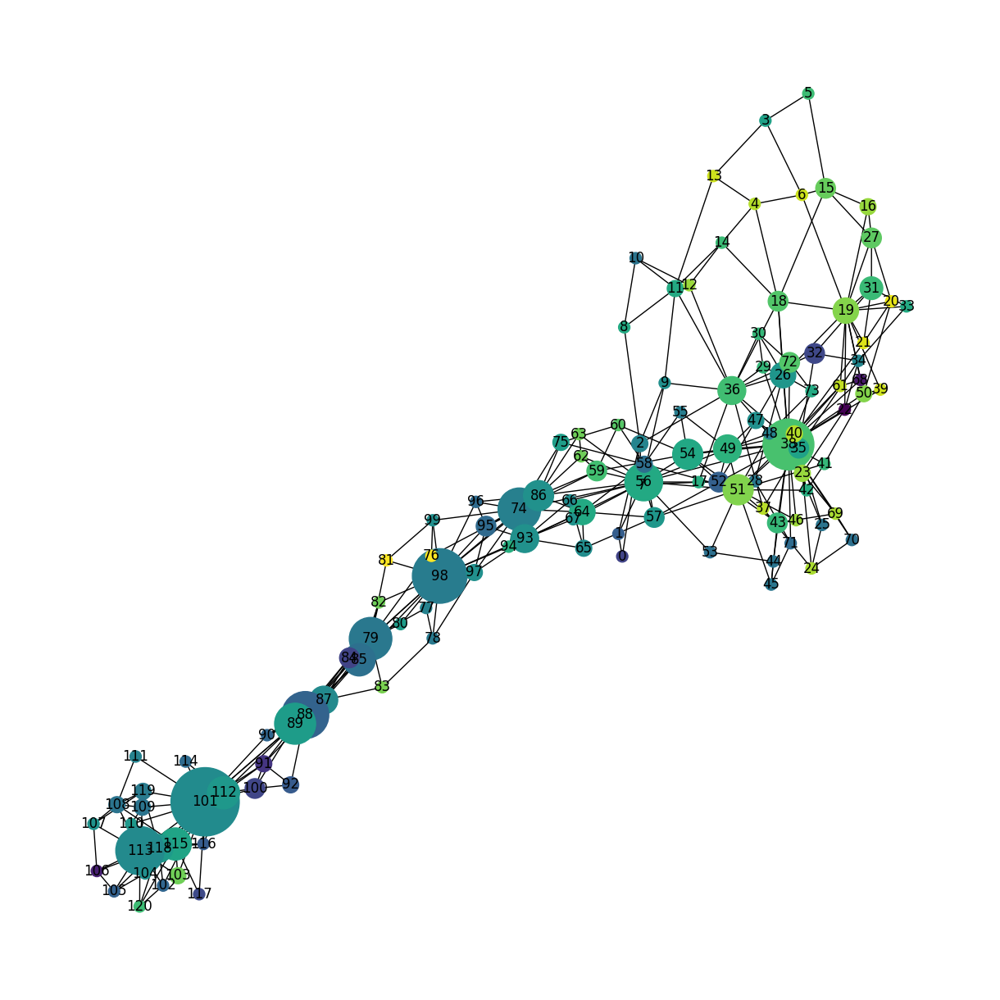

Processing modified graph 11...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,4.666667,1,0.000000,0.011050,0.849765,0.003977,0.000000,0.095238,0.000029
1,1,5.488889,1,0.001028,0.016575,0.884983,0.005374,0.000000,0.142857,0.000060
2,2,4.333333,1,0.007272,0.016575,0.964721,0.006015,0.000000,0.079365,0.000173
3,3,2.133333,1,0.000000,0.016575,0.864256,0.005873,0.333333,0.309524,0.000096
4,4,4.044444,1,0.022729,0.022099,0.986760,0.006411,0.166667,0.077381,0.000346
...,...,...,...,...,...,...,...,...,...,...
177,169,3.177778,1,0.003390,0.016575,0.623319,0.005129,0.000000,0.269841,0.000322
178,170,3.177778,1,0.001136,0.016575,0.561116,0.004994,0.000000,0.523810,0.000251
179,171,3.466667,1,0.000599,0.016575,0.560454,0.004923,0.000000,0.436508,0.000181
180,172,4.622222,1,0.000430,0.016575,0.559053,0.004846,0.000000,0.301587,0.000192


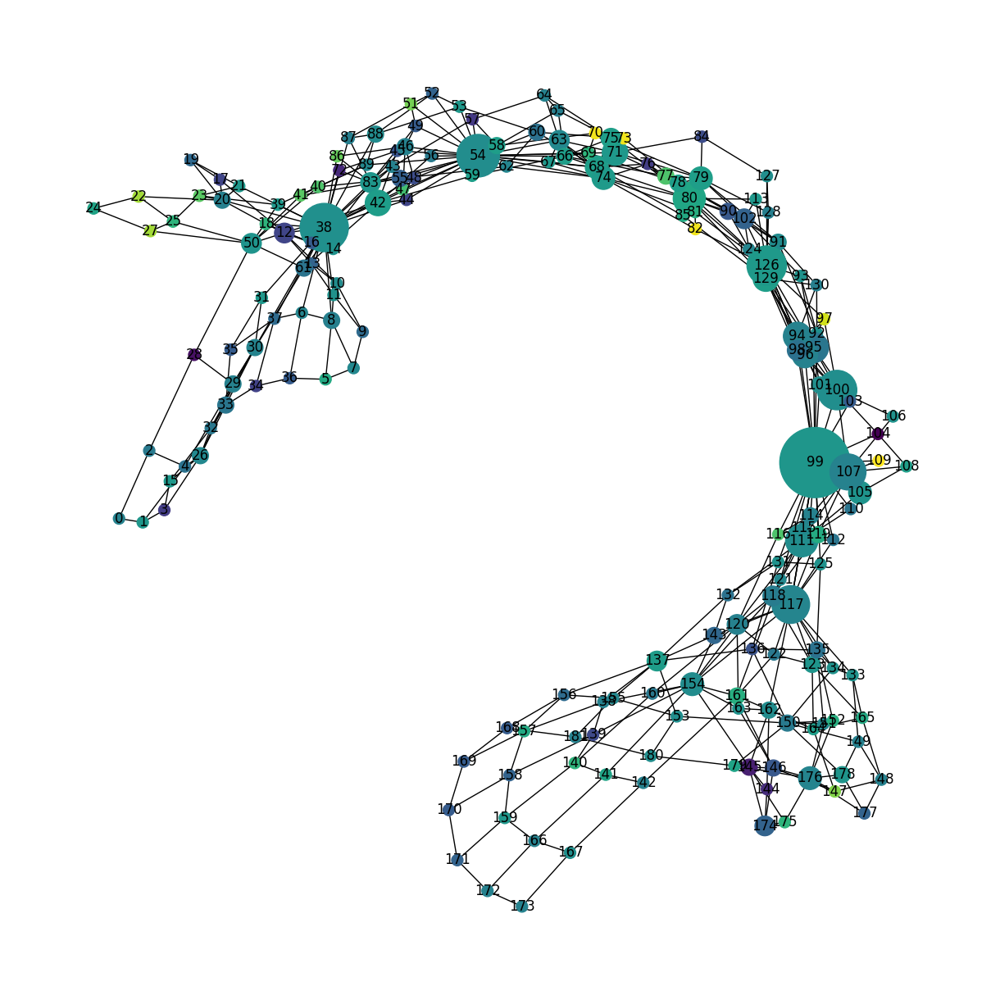

Processing modified graph 12...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,4.000000,1,0.000000,0.017391,0.599036,0.003435,1.000000,0.260937,0.000788
1,1,4.857143,1,0.014977,0.026087,0.656276,0.004522,0.666667,0.166667,0.001334
2,2,5.584416,2,0.000458,0.052174,0.665581,0.007905,0.333333,0.313021,0.004917
3,7,7.454545,1,0.036488,0.034783,0.713261,0.004995,0.666667,0.196875,0.004829
4,37,7.593074,3,0.014299,0.052174,0.828791,0.006307,0.333333,0.308333,0.026610
...,...,...,...,...,...,...,...,...,...,...
111,110,6.536797,3,0.000000,0.034783,0.981543,0.005503,0.333333,0.289062,0.006080
112,111,6.623377,1,0.000000,0.017391,0.622021,0.002763,1.000000,0.640625,0.004986
113,115,5.389610,4,0.004770,0.017391,0.913559,0.003370,1.000000,0.132812,0.006585
114,108,4.727273,1,0.000899,0.026087,0.939447,0.004935,0.000000,0.142708,0.005444


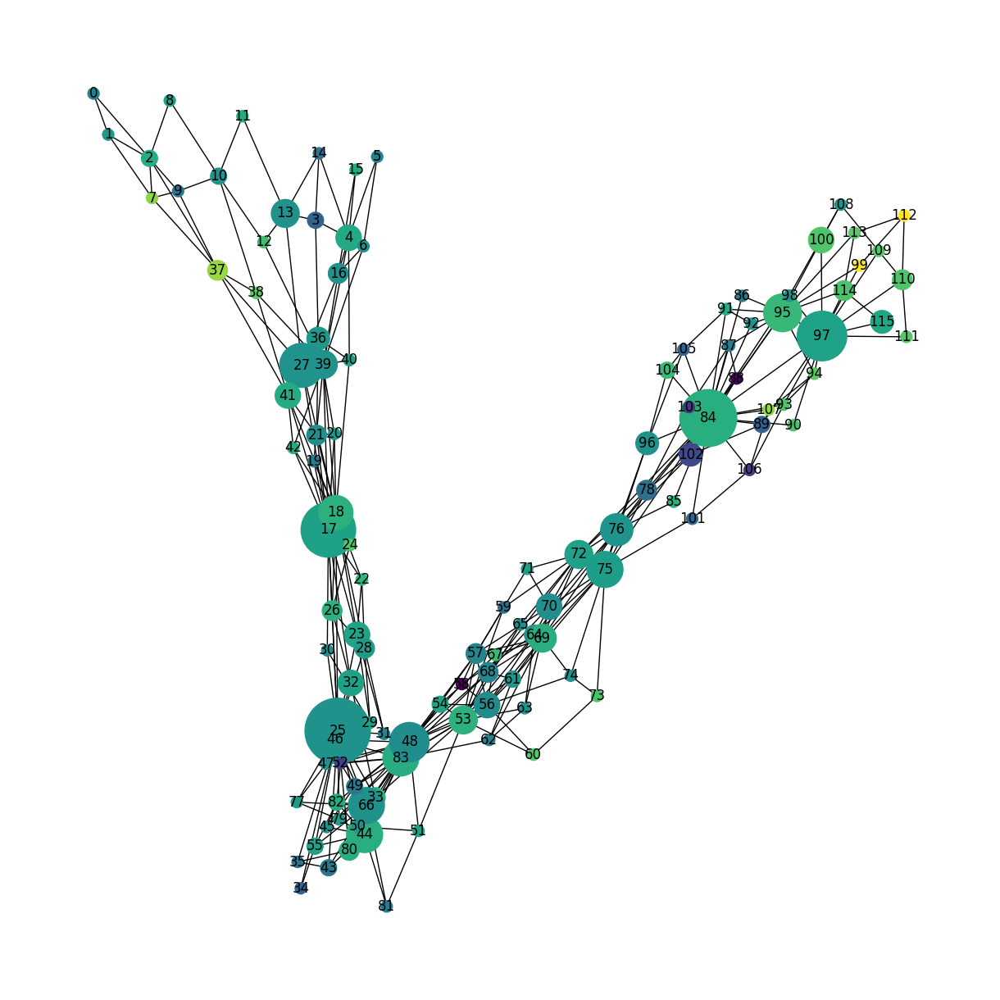

Processing modified graph 13...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,4.776119,1,0.000000,0.018182,1.587857,0.000022,0.000000,0.068182,0.000099
1,1,5.223881,1,0.013766,0.027273,1.705346,0.000029,0.333333,0.060606,0.000260
2,2,5.044776,1,0.012976,0.027273,1.454036,0.000036,0.000000,0.202020,0.000602
3,3,4.432836,1,0.000000,0.018182,1.477652,0.000022,1.000000,0.113636,0.000285
4,7,5.626866,3,0.081924,0.063636,1.749313,0.000070,0.190476,0.082251,0.002110
...,...,...,...,...,...,...,...,...,...,...
106,109,6.641791,4,0.069249,0.054545,1.414819,0.036604,0.400000,0.202020,0.021142
107,100,4.104478,1,0.000050,0.018182,1.414819,0.009532,1.000000,0.265152,0.005317
108,101,5.194030,2,0.000067,0.027273,1.414819,0.017356,0.333333,0.267677,0.006744
109,102,5.691542,3,0.000000,0.018182,1.402790,0.018031,0.000000,0.204545,0.011022


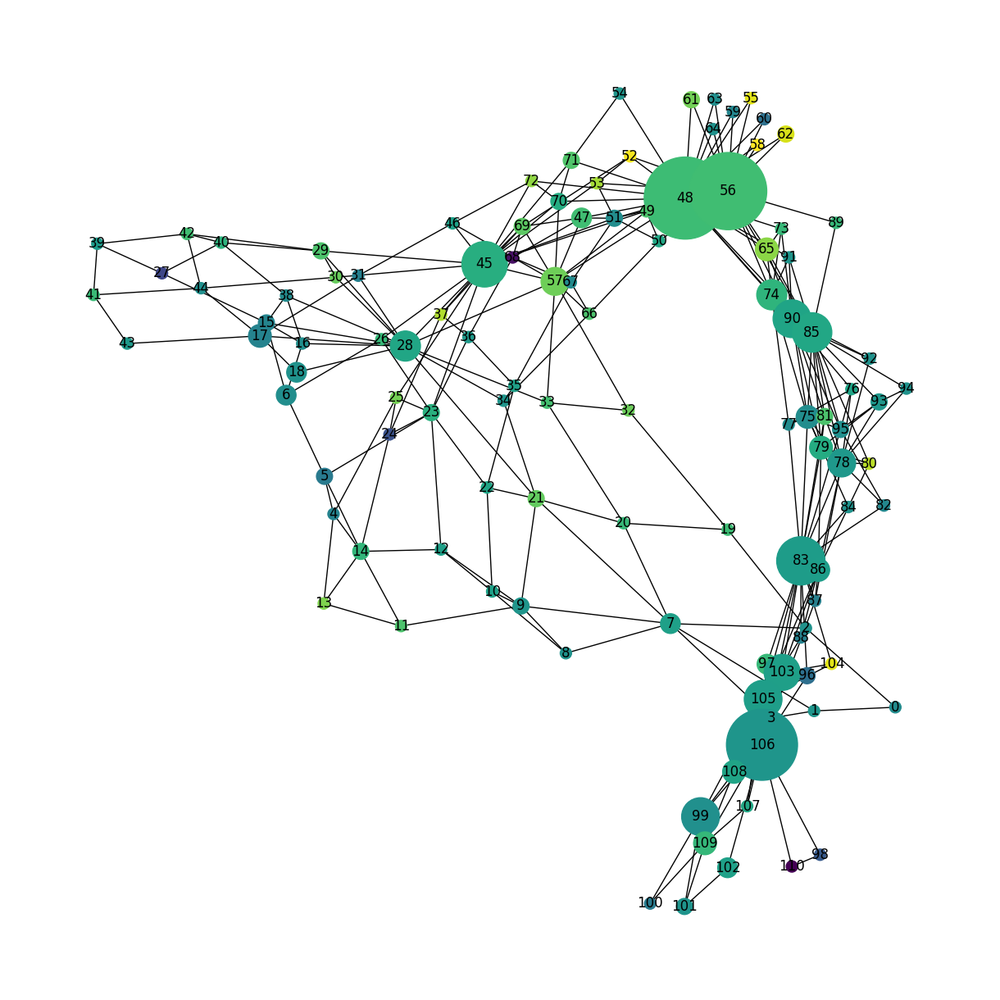

Processing modified graph 14...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,1.950000,1,0.000000,0.017391,0.855902,0.001166,0.000000,0.569444,0.001770
1,1,6.000000,1,0.000000,0.026087,0.878421,0.001711,0.000000,0.462963,0.002432
2,2,4.600000,1,0.041773,0.026087,1.277384,0.002513,0.333333,0.222222,0.011680
3,8,4.666667,1,0.000000,0.026087,1.036295,0.001917,0.333333,0.212963,0.003766
4,9,4.200000,1,0.017821,0.034783,1.277384,0.003134,0.333333,0.173611,0.013190
...,...,...,...,...,...,...,...,...,...,...
111,103,4.600000,1,0.046486,0.026087,1.660650,0.000125,0.333333,0.046296,0.009401
112,104,3.033333,1,0.014317,0.026087,1.660650,0.000124,0.000000,0.101852,0.003282
113,113,0.866667,1,0.001698,0.026087,1.150320,0.000152,0.000000,0.277778,0.008897
114,114,5.000000,1,0.002197,0.026087,1.286114,0.000126,0.000000,0.333333,0.004098


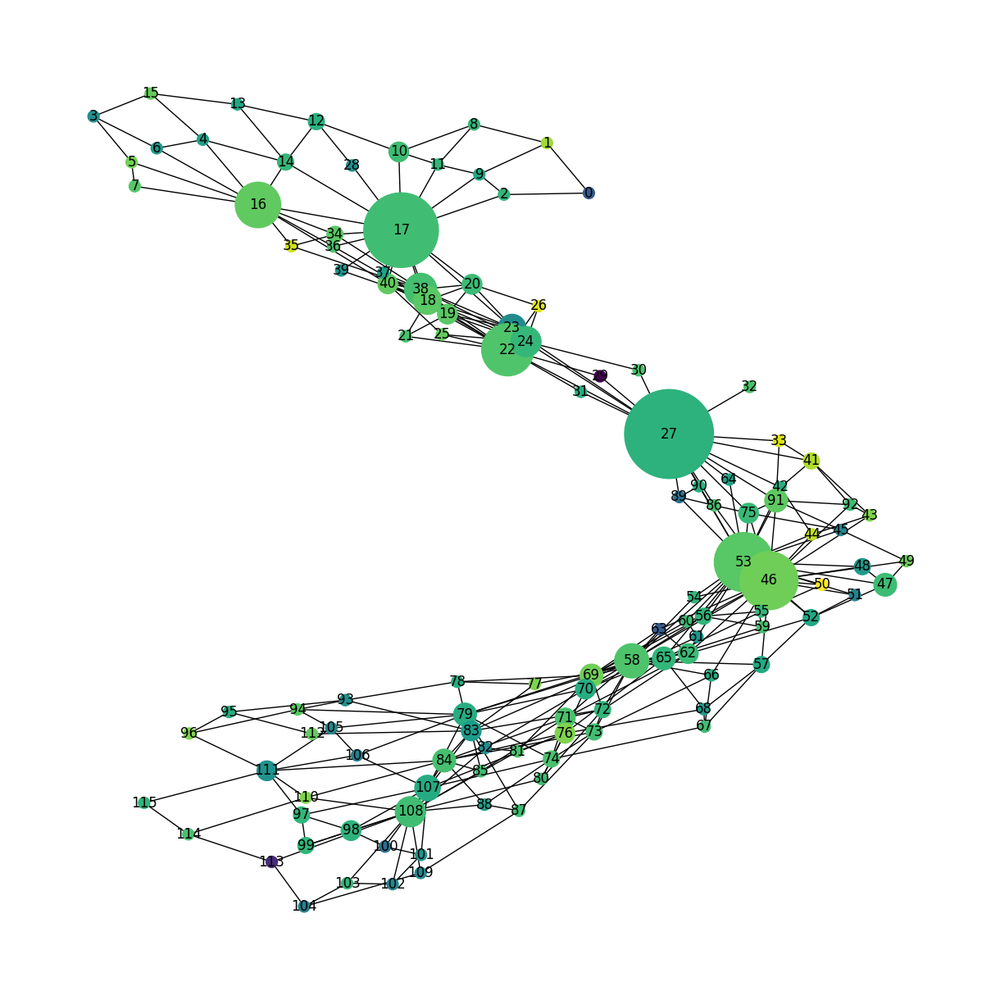

Processing modified graph 15...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,5.309859,1,0.000177,0.014706,0.808429,0.000017,0.000000,0.078431,0.000739
1,1,4.929577,1,0.012388,0.022059,0.891333,0.000025,0.333333,0.281046,0.001414
2,2,4.943662,1,0.000000,0.022059,0.803708,0.000027,0.000000,0.307190,0.005000
3,6,4.788732,1,0.000310,0.022059,0.922144,0.000024,0.666667,0.274510,0.002090
4,7,5.492958,2,0.038474,0.051471,1.141052,0.000056,0.142857,0.285714,0.007877
...,...,...,...,...,...,...,...,...,...,...
132,129,4.788732,2,0.010720,0.022059,0.574400,0.004739,0.333333,0.143791,0.004249
133,124,4.028169,1,0.000000,0.022059,0.443246,0.004874,1.000000,0.609150,0.010342
134,127,8.591549,1,0.010972,0.022059,0.517782,0.005157,0.666667,0.235294,0.010344
135,133,7.605634,1,0.000000,0.014706,0.698771,0.007444,1.000000,0.090196,0.016061


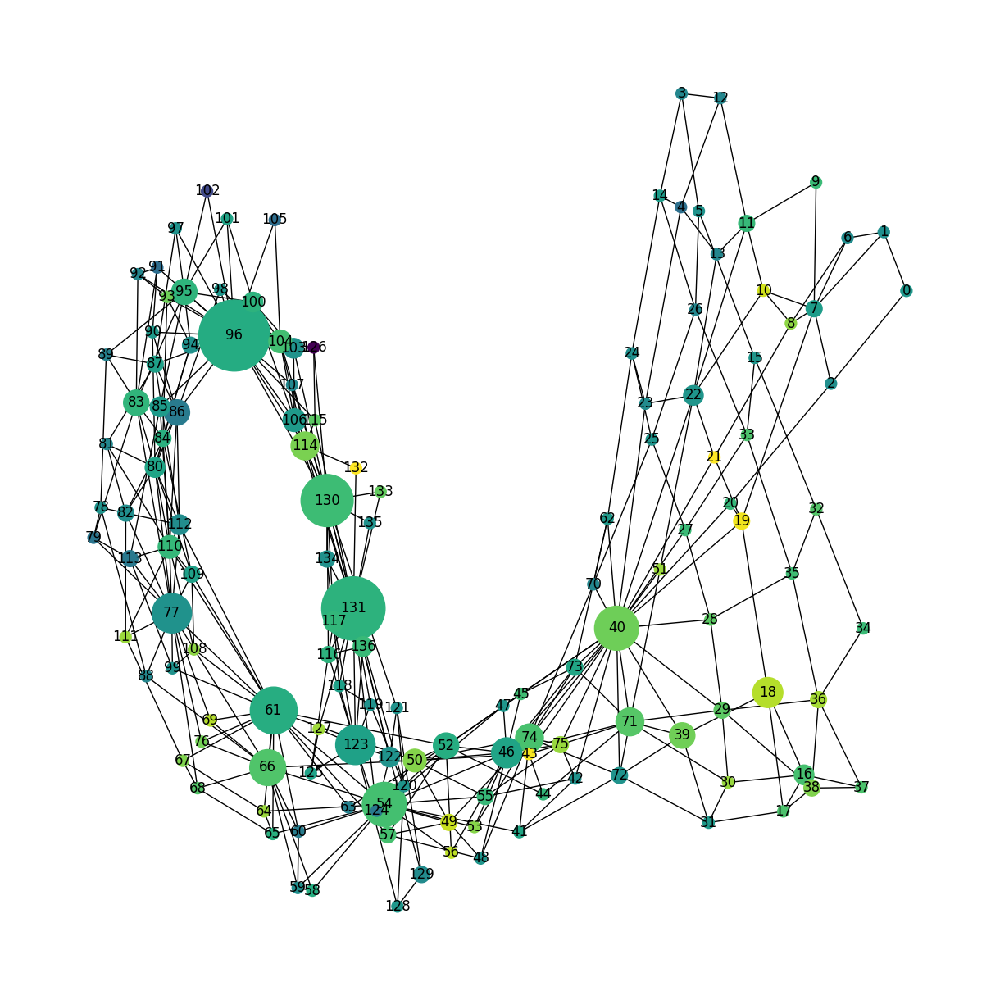

Processing modified graph 16...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,5.666667,1,0.000858,0.018692,1.305308,0.005351,0.000000,0.067568,0.002200
1,1,5.166667,1,0.001872,0.028037,1.357216,0.008121,0.000000,0.234234,0.004084
2,2,5.333333,1,0.012788,0.028037,1.387662,0.007102,0.000000,0.243243,0.015835
3,3,6.500000,1,0.015699,0.018692,1.884341,0.005235,0.000000,0.121622,0.002474
4,4,7.666667,1,0.000000,0.037383,1.671169,0.008923,0.000000,0.310811,0.028877
...,...,...,...,...,...,...,...,...,...,...
103,95,5.200000,1,0.000000,0.028037,1.177923,0.006325,0.666667,0.585586,0.015738
104,96,5.000000,1,0.000771,0.028037,1.603483,0.006559,0.333333,0.342342,0.016250
105,97,5.583333,2,0.000882,0.037383,1.530344,0.008619,0.166667,0.135135,0.010389
106,98,5.333333,1,0.000000,0.028037,1.821905,0.007213,0.333333,0.189189,0.016277


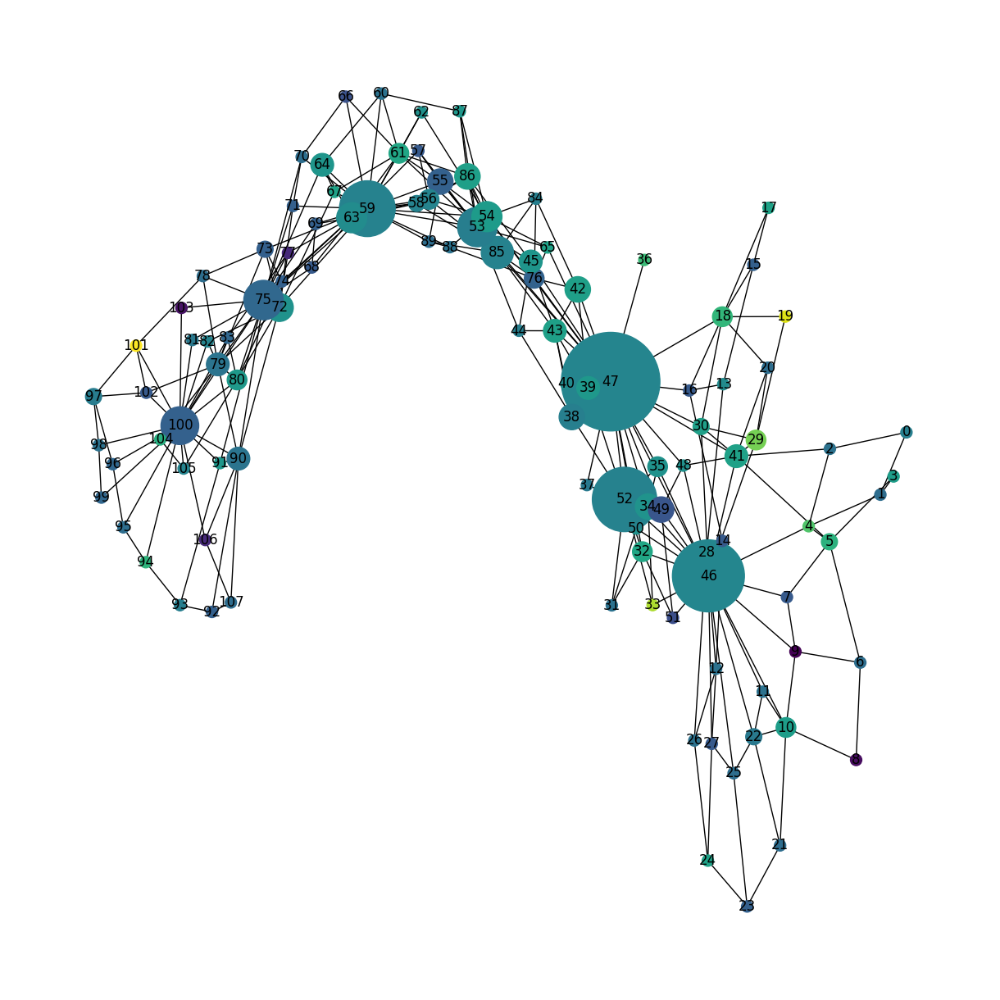

Processing modified graph 17...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,5.588235,1,0.010331,0.015625,1.330833,0.004314,0.000000,0.081967,0.002948
1,1,6.029412,1,0.000000,0.015625,1.249680,0.004155,0.000000,0.262295,0.006468
2,2,4.558824,1,0.020579,0.023438,1.564103,0.006160,0.000000,0.169399,0.015883
3,13,5.698529,4,0.013901,0.046875,1.303288,0.011827,0.066667,0.278689,0.046130
4,14,5.441176,1,0.033184,0.023438,1.783870,0.005062,0.333333,0.109290,0.068207
...,...,...,...,...,...,...,...,...,...,...
124,121,4.852941,1,0.008497,0.023438,1.824299,0.004995,0.000000,0.103825,0.002411
125,122,4.558824,1,0.000390,0.023438,1.686757,0.005206,0.000000,0.103825,0.001260
126,123,5.000000,1,0.000000,0.023438,1.875571,0.005156,0.333333,0.103825,0.002129
127,124,5.000000,1,0.000000,0.023438,2.132751,0.004955,0.666667,0.071038,0.002116


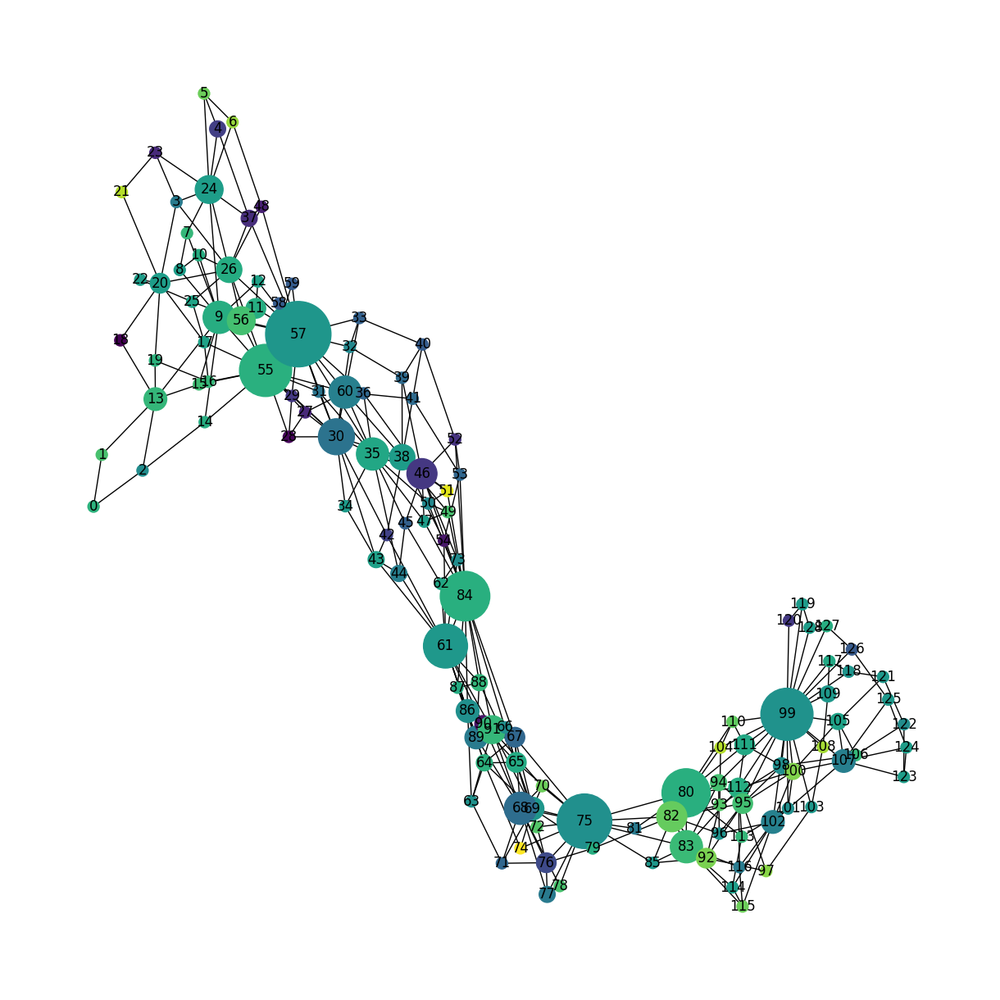

Processing modified graph 18...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,5.178571,1,0.015804,0.012579,1.102720,0.004366,0.000000,0.347222,0.000169
1,1,2.089286,1,0.008373,0.018868,0.690071,0.006491,0.000000,0.453704,0.000166
2,2,6.071429,1,0.030733,0.018868,1.294788,0.005301,0.000000,0.148148,0.001252
3,13,6.785714,1,0.000637,0.018868,0.678456,0.004589,0.333333,0.555556,0.000253
4,20,4.642857,1,0.011778,0.025157,1.189823,0.006479,0.000000,0.277778,0.001320
...,...,...,...,...,...,...,...,...,...,...
155,152,6.607143,1,0.009886,0.018868,1.026174,0.004574,0.333333,0.138889,0.000817
156,153,3.857143,1,0.001732,0.018868,0.971817,0.004625,0.333333,0.101852,0.000945
157,157,3.017857,2,0.000398,0.025157,0.857092,0.006154,0.166667,0.341667,0.001595
158,149,8.250000,1,0.000637,0.018868,0.887993,0.003547,0.000000,0.324074,0.000830


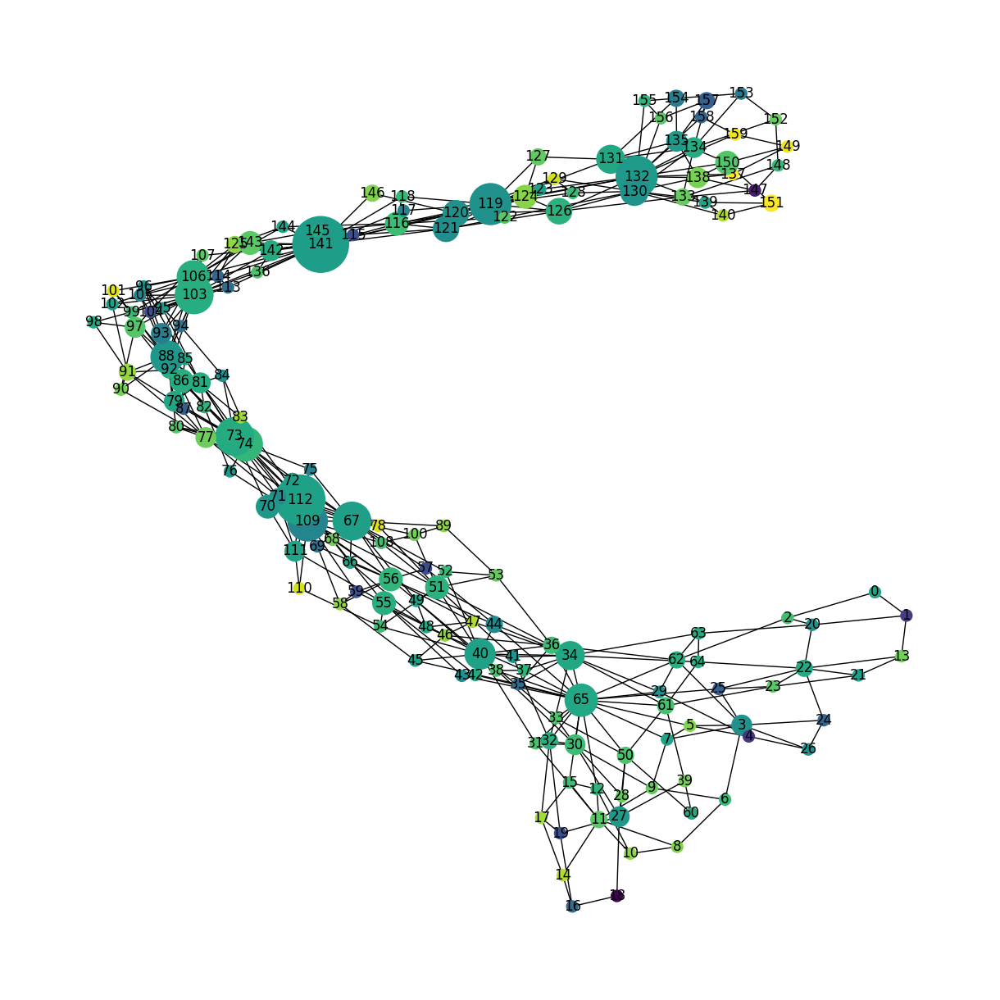

Processing modified graph 19...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,3.742424,1,0.000133,0.01626,1.002014,0.005464,0.000000,0.072727,0.002312
1,1,3.939394,1,0.015352,0.02439,1.020147,0.007203,0.000000,0.072727,0.002938
2,2,4.727273,1,0.000200,0.02439,0.952093,0.006962,0.333333,0.163636,0.015262
3,10,7.454545,1,0.044740,0.02439,1.077332,0.006190,0.000000,0.096970,0.002890
4,11,4.924242,1,0.015036,0.03252,0.985089,0.008575,0.166667,0.145455,0.017683
...,...,...,...,...,...,...,...,...,...,...
119,111,4.581818,1,0.000000,0.02439,0.811287,0.006160,0.333333,0.224242,0.008527
120,112,4.363636,1,0.023257,0.02439,0.843453,0.006821,0.333333,0.066667,0.004880
121,113,3.272727,1,0.030912,0.02439,0.819742,0.008089,0.333333,0.115152,0.004327
122,114,4.333333,1,0.015913,0.02439,0.727685,0.008505,0.000000,0.206061,0.002001


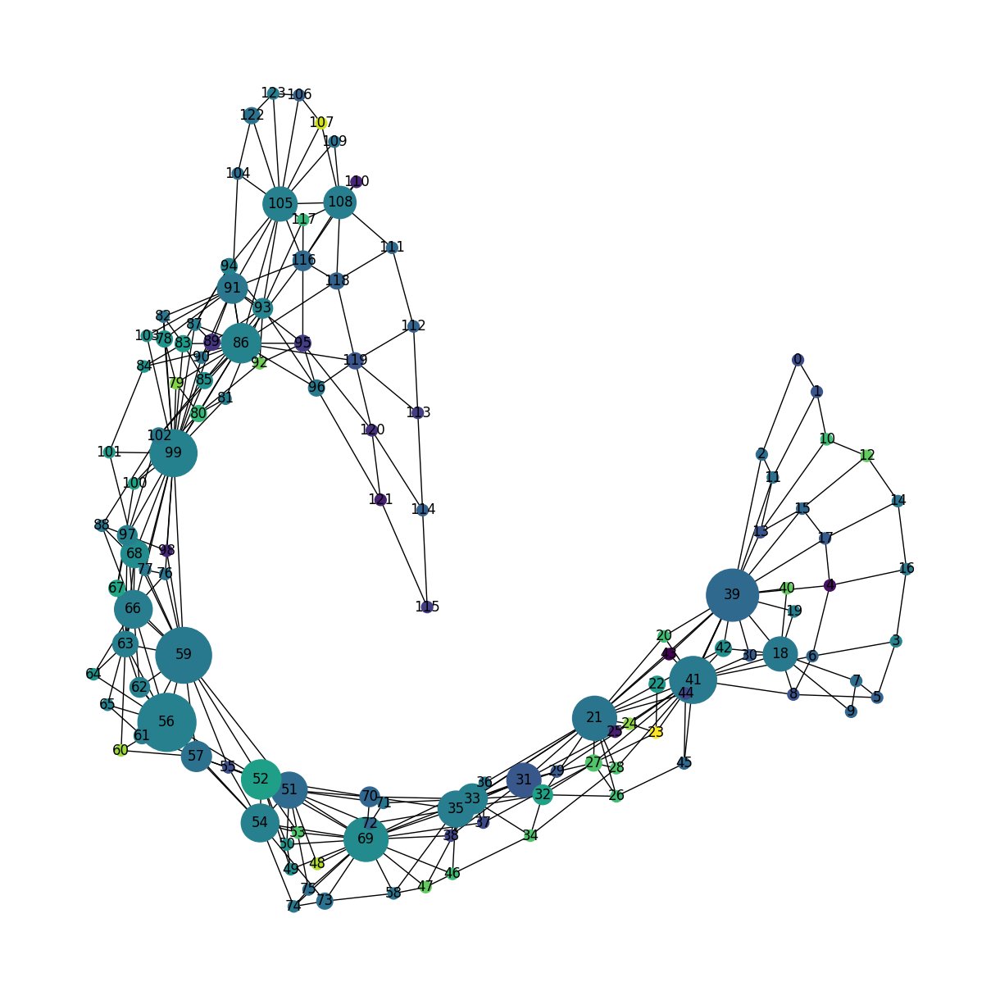

Processing modified graph 20...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,5.686275,1,0.000000,0.012987,1.081841,0.000016,0.000000,0.159091,0.000240
1,1,5.098039,1,0.008659,0.019481,1.159797,0.000023,0.000000,0.190909,0.000350
2,2,4.235294,1,0.002971,0.019481,1.403015,0.000023,0.333333,0.159091,0.001500
3,3,7.686275,1,0.016897,0.019481,1.696035,0.000022,0.000000,0.284848,0.000537
4,4,4.333333,1,0.001613,0.025974,1.360479,0.000029,0.166667,0.210227,0.001901
...,...,...,...,...,...,...,...,...,...,...
150,151,5.294118,1,0.000000,0.019481,0.953158,0.057533,0.000000,0.628788,0.001658
151,152,4.129412,1,0.000991,0.019481,1.515884,0.040627,0.000000,0.242424,0.000991
152,153,4.078431,1,0.003027,0.019481,1.433164,0.020540,0.000000,0.090909,0.000867
153,154,4.333333,2,0.001146,0.025974,1.499911,0.014932,0.166667,0.278409,0.002103


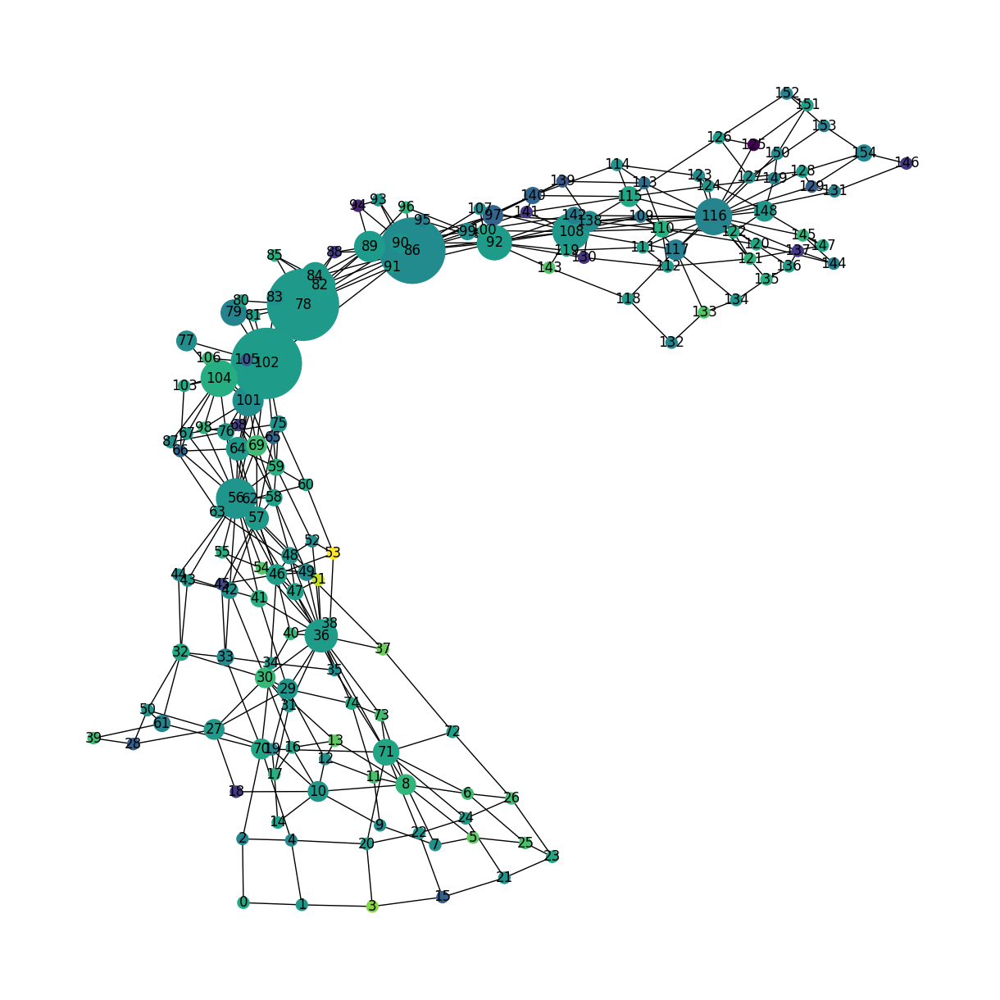

Processing modified graph 21...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,2.803922,1,0.000000,0.019608,0.687099,0.010746,0.000000,0.235602,0.000070
1,1,5.294118,1,0.000000,0.019608,0.755643,0.009620,0.000000,0.274869,0.000154
2,2,3.313725,1,0.012705,0.029412,0.712478,0.012732,0.000000,0.314136,0.000429
3,3,5.607843,2,0.082105,0.049020,0.837683,0.017327,0.000000,0.231414,0.001107
4,39,4.745098,1,0.019979,0.029412,1.111035,0.009712,0.000000,0.331588,0.002442
...,...,...,...,...,...,...,...,...,...,...
98,91,5.751634,3,0.014014,0.049020,1.034186,0.008053,0.800000,0.127749,0.048628
99,90,6.692810,15,0.000000,0.058824,0.957205,0.010099,0.533333,0.242583,0.041850
100,92,5.686275,1,0.000000,0.039216,1.020588,0.007075,1.000000,0.155759,0.037375
101,94,6.274510,3,0.000000,0.019608,0.790537,0.004100,1.000000,0.450262,0.019091


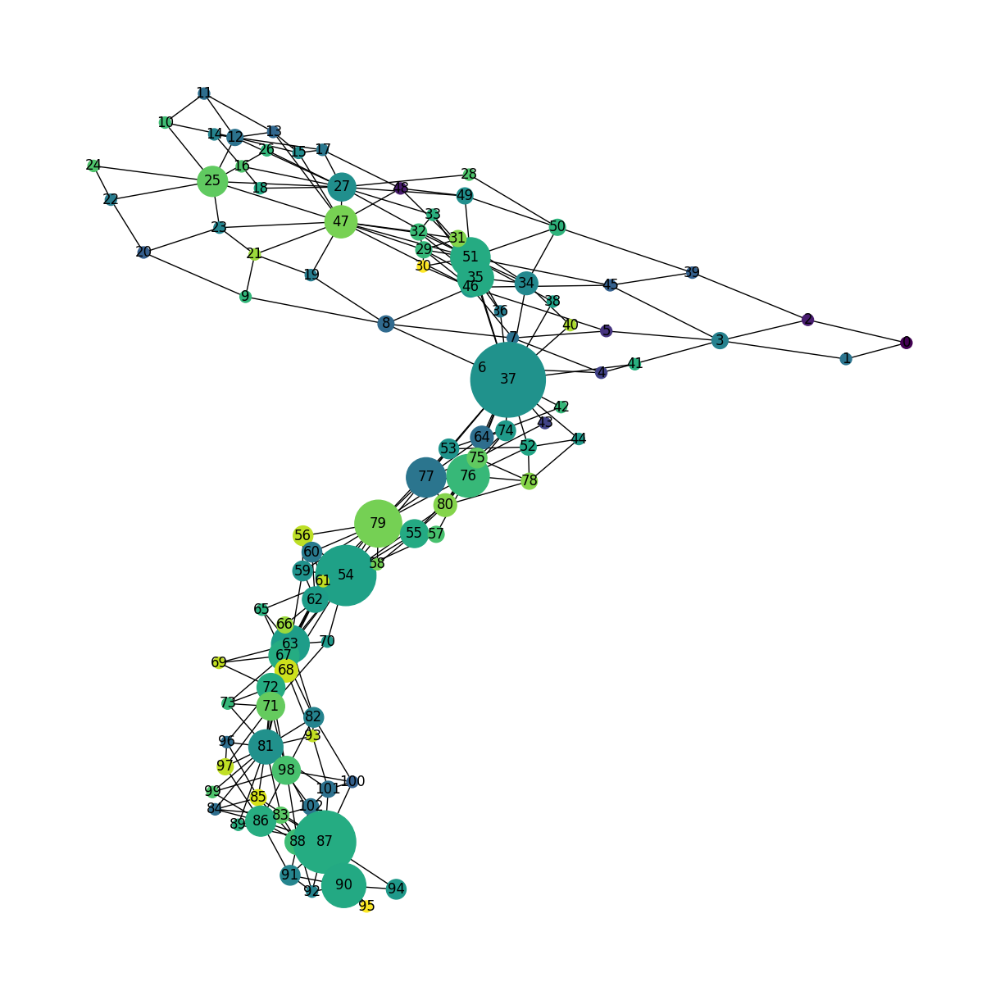

Processing modified graph 22...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,6.983607,10,0.018246,0.06,1.474410,0.011451,0.333333,0.118644,0.014485
1,31,6.311475,2,0.004448,0.05,1.658701,0.009885,0.400000,0.169492,0.020414
2,1,8.688525,1,0.000000,0.02,1.484127,0.003922,1.000000,0.101695,0.003930
3,29,5.655738,4,0.031623,0.10,1.873016,0.027504,0.155556,0.257966,0.034399
4,3,6.147541,2,0.012233,0.05,1.737543,0.009402,0.400000,0.160000,0.014605
...,...,...,...,...,...,...,...,...,...,...
96,98,7.844262,4,0.002761,0.03,1.001426,0.004921,0.666667,0.211299,0.031623
97,100,7.212274,39,0.021836,0.05,1.181560,0.008558,0.300000,0.276610,0.034640
98,90,10.000000,1,0.000000,0.02,0.824990,0.003280,1.000000,0.430508,0.025750
99,91,8.491803,4,0.000000,0.02,0.942402,0.003536,1.000000,0.277966,0.027665


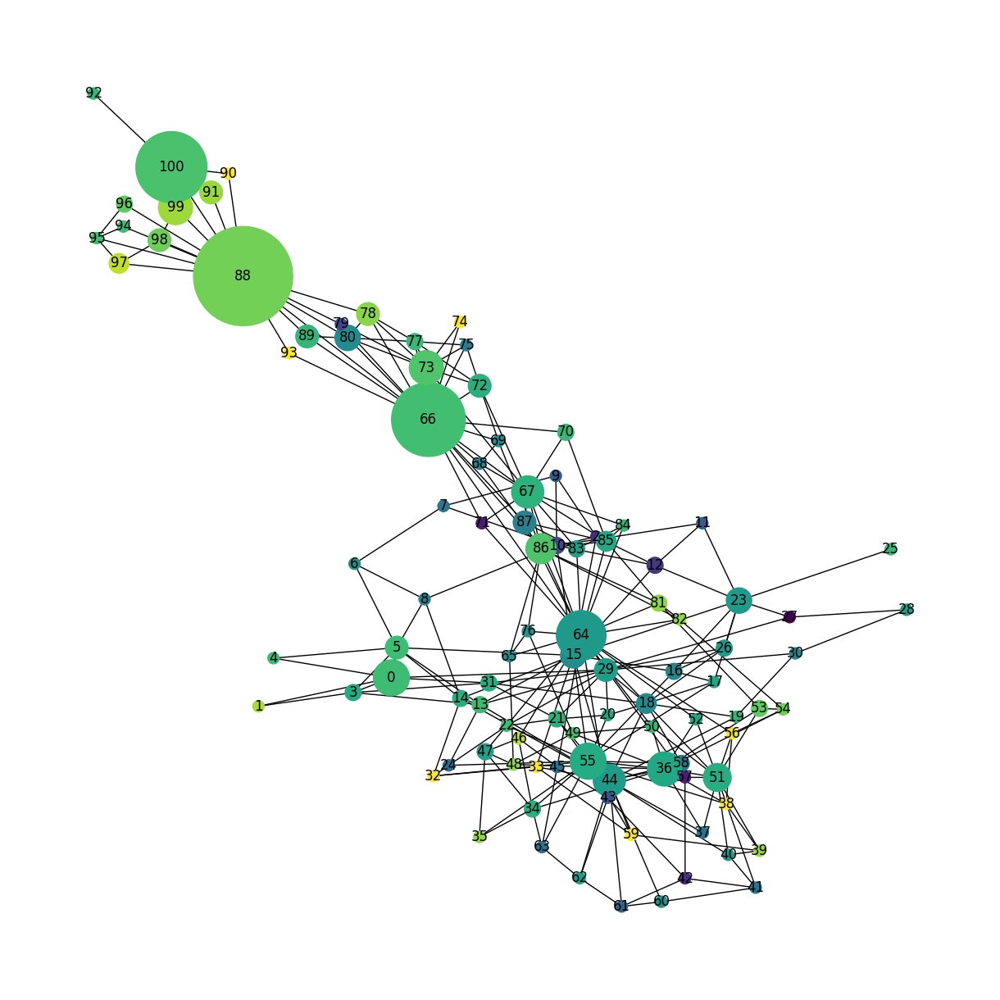

Processing modified graph 23...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,6.410256,1,0.000000,0.013158,0.616205,0.003510,0.000000,0.338710,0.000112
1,1,7.948718,1,0.008426,0.019737,0.696712,0.004787,0.000000,0.268817,0.000162
2,2,3.333333,1,0.000087,0.019737,0.624122,0.005089,0.000000,0.481720,0.000800
3,13,5.384615,1,0.026255,0.019737,0.840948,0.004649,0.000000,0.182796,0.000158
4,16,5.666667,1,0.009272,0.026316,0.773448,0.005875,0.000000,0.403226,0.001034
...,...,...,...,...,...,...,...,...,...,...
148,149,5.641026,1,0.005962,0.019737,0.896943,0.005000,0.333333,0.161290,0.003212
149,150,2.538462,1,0.001525,0.019737,0.796161,0.006024,0.666667,0.243011,0.003200
150,151,3.692308,1,0.015422,0.019737,0.873078,0.005624,0.333333,0.169892,0.003125
151,152,4.615385,1,0.003813,0.019737,0.832068,0.005656,0.000000,0.169892,0.001507


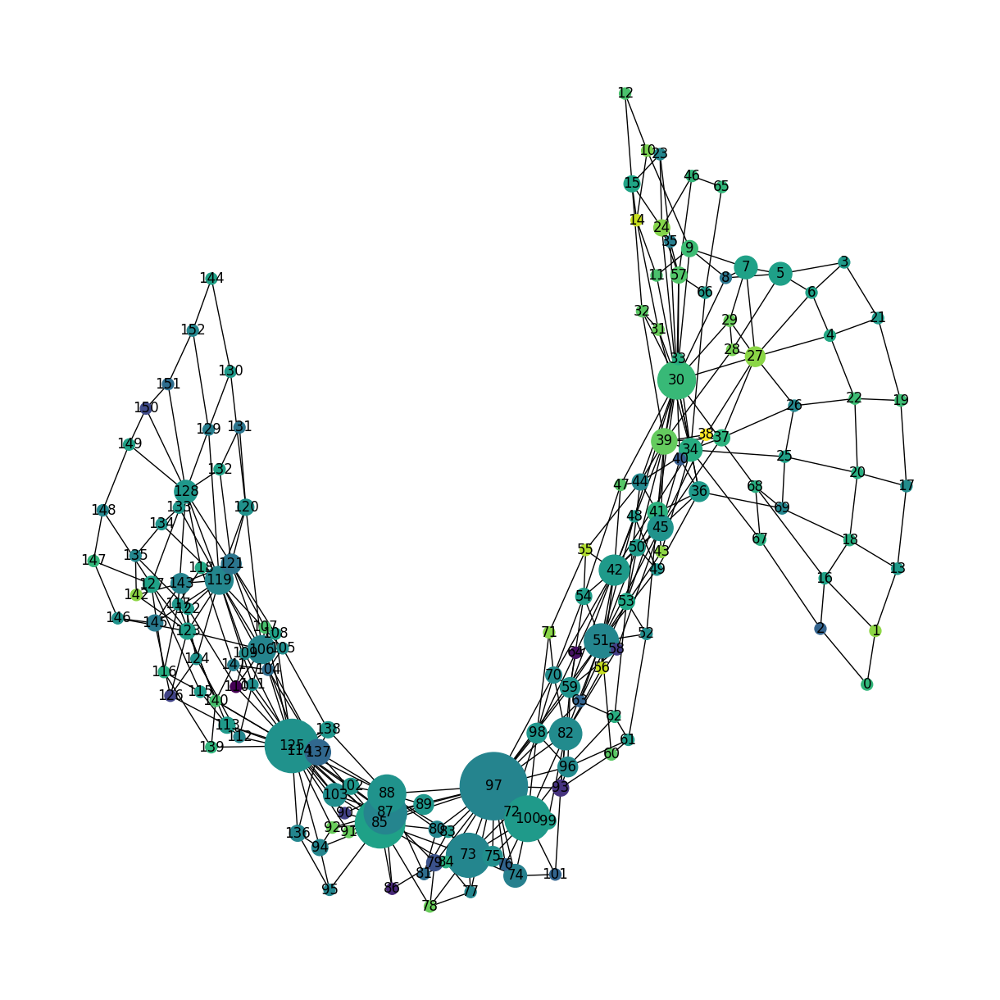

Processing modified graph 24...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,0.000000,1,0.000000,0.018868,0.810725,0.208671,0.000000,0.716981,0.000399
1,1,7.121212,1,0.000794,0.028302,1.586737,0.112248,0.000000,0.383648,0.000625
2,2,5.272727,1,0.015070,0.028302,1.446224,0.130448,0.333333,0.308176,0.002948
3,3,6.212121,1,0.002815,0.028302,1.605785,0.048355,0.000000,0.201258,0.001232
4,4,5.909091,1,0.042265,0.037736,1.968052,0.090379,0.166667,0.188679,0.003376
...,...,...,...,...,...,...,...,...,...,...
102,94,4.898990,3,0.027709,0.037736,1.459979,0.000029,0.666667,0.108491,0.022063
103,95,5.435606,8,0.034911,0.066038,1.459979,0.000051,0.333333,0.140162,0.038463
104,96,5.568182,4,0.000000,0.047170,1.254578,0.000039,0.500000,0.316226,0.025963
105,97,5.151515,1,0.012283,0.028302,1.368442,0.000026,0.333333,0.343396,0.012477


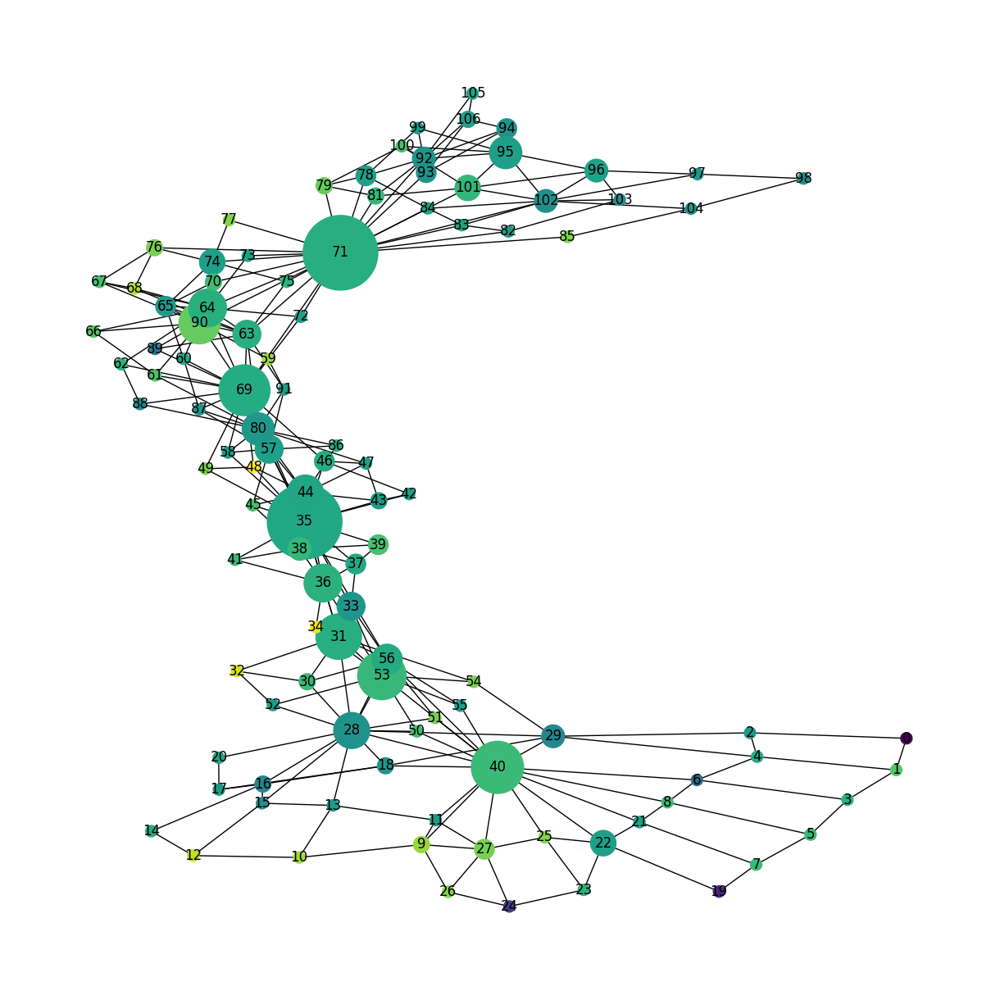

Processing modified graph 25...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,4.821429,1,0.000000,0.018692,1.011943,0.000044,0.000000,0.144231,0.001696
1,1,5.142857,1,0.011543,0.028037,1.107264,0.000059,0.333333,0.085470,0.002597
2,2,5.892857,1,0.002673,0.028037,1.203027,0.000081,0.000000,0.149573,0.009531
3,3,5.107143,1,0.020539,0.018692,1.189312,0.000038,1.000000,0.048077,0.002196
4,4,4.732143,4,0.044285,0.056075,1.234159,0.000147,0.133333,0.112179,0.015956
...,...,...,...,...,...,...,...,...,...,...
103,91,3.642857,1,0.000000,0.028037,0.976312,0.006996,0.333333,0.363248,0.038377
104,105,1.767857,1,0.000000,0.018692,0.731303,0.004357,1.000000,0.384615,0.021228
105,92,5.357143,1,0.014552,0.037383,1.073648,0.007607,0.333333,0.160256,0.037987
106,106,6.904762,3,0.032446,0.028037,1.095491,0.005413,0.666667,0.042735,0.021677


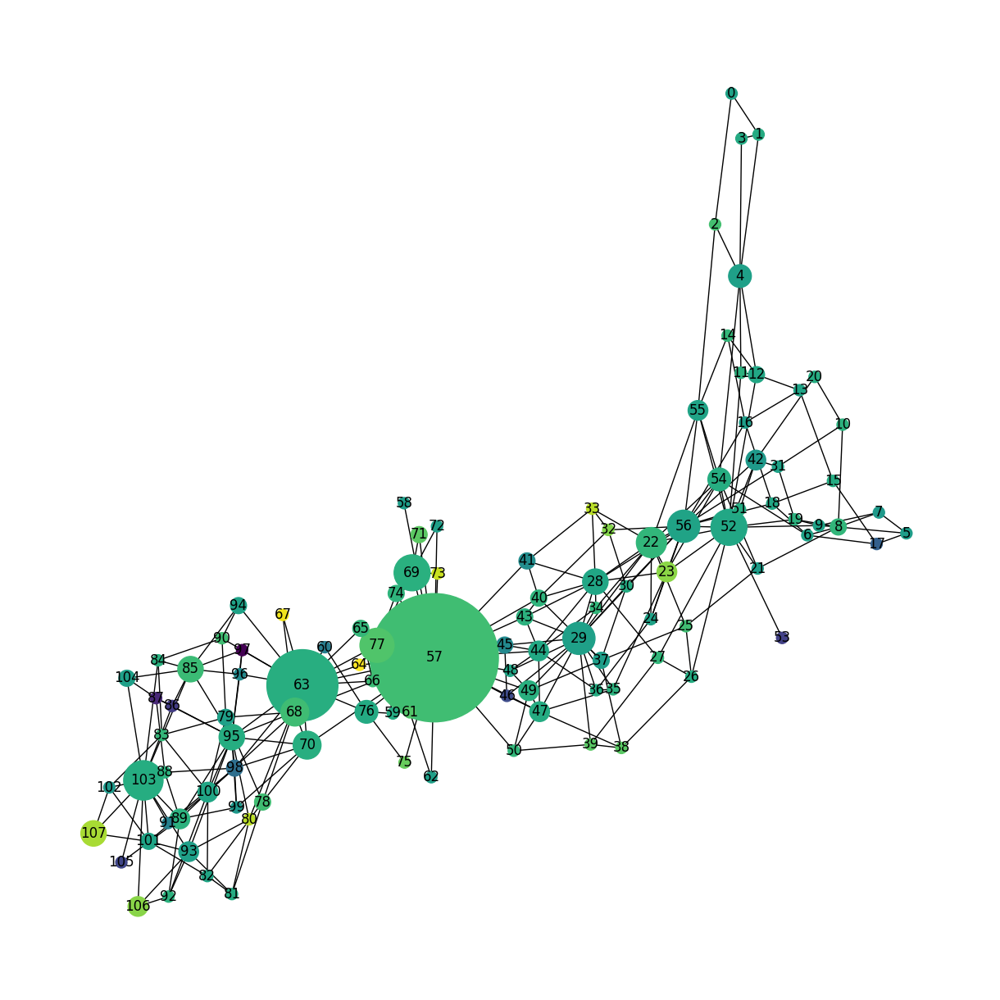

Processing modified graph 26...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,2.869565,2,0.000000,0.023077,1.039750,0.006921,0.666667,0.350000,0.051170
1,1,2.633540,21,0.000119,0.069231,1.150137,0.016906,0.444444,0.311111,0.218620
2,12,2.152174,1,0.005109,0.015385,1.230129,0.005585,1.000000,0.150000,0.027862
3,23,3.049819,24,0.071209,0.084615,1.500635,0.022641,0.218182,0.181818,0.152431
4,31,2.032609,2,0.000072,0.023077,1.160403,0.006796,1.000000,0.200000,0.077718
...,...,...,...,...,...,...,...,...,...,...
126,126,7.173913,1,0.000000,0.023077,0.818588,0.003400,0.666667,0.433333,0.000500
127,127,7.173913,1,0.004874,0.023077,1.227226,0.003295,0.666667,0.366667,0.000468
128,128,6.231884,3,0.000000,0.023077,0.734962,0.003331,0.666667,0.583333,0.000450
129,129,7.173913,1,0.004069,0.023077,1.304173,0.003194,0.666667,0.213333,0.000407


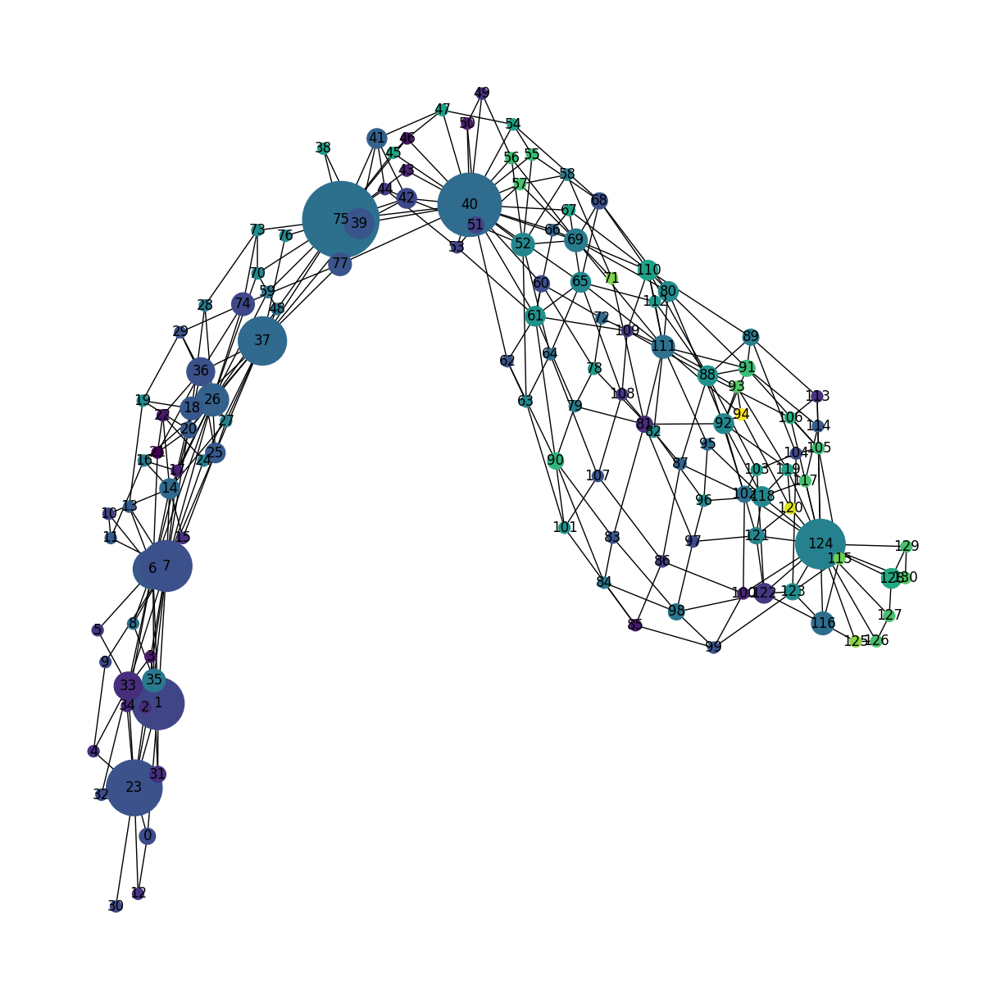

Processing modified graph 27...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,4.462687,1,0.000000,0.008197,1.132574,0.006346,0.000000,0.230769,0.000145
1,1,5.024876,3,0.085221,0.040984,1.528896,0.030394,0.100000,0.207692,0.001095
2,2,4.835821,1,0.006128,0.024590,1.109828,0.011932,0.333333,0.237179,0.000724
3,21,5.970149,3,0.204469,0.065574,1.659690,0.015677,0.035714,0.088942,0.007269
4,12,0.149254,1,0.029806,0.024590,1.307664,0.047294,0.000000,0.307692,0.000341
...,...,...,...,...,...,...,...,...,...,...
118,118,4.626866,1,0.000000,0.024590,0.820550,0.004225,0.333333,0.551282,0.003298
119,119,4.477612,1,0.000172,0.024590,0.996795,0.004419,0.333333,0.250000,0.002399
120,120,4.626866,1,0.010480,0.024590,1.015462,0.004216,0.000000,0.153846,0.001795
121,121,7.462687,1,0.000000,0.024590,0.930697,0.004370,0.000000,0.269231,0.001765


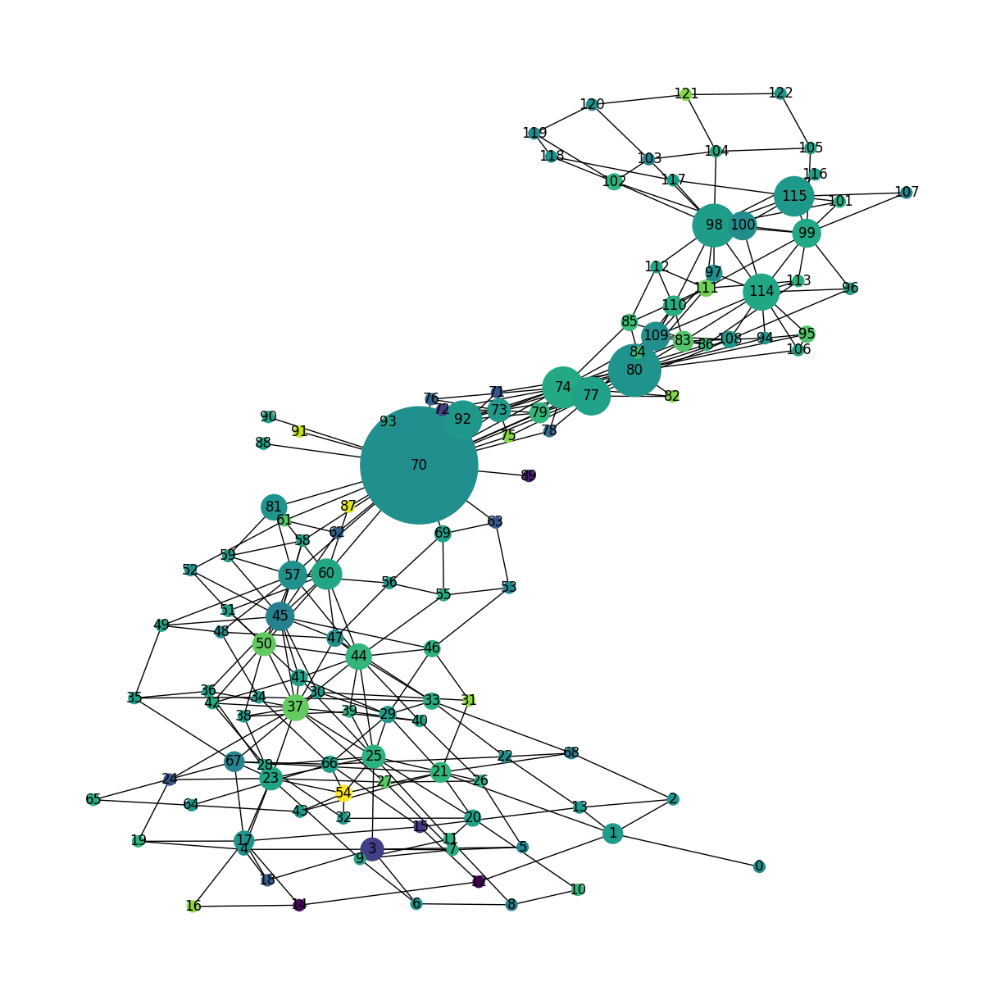

Processing modified graph 28...


,Node,weight,num_nodes,Betweenness,Degree,Closeness,PageRank,Clustering,avg_neighbour_resistance,Eigenvector
0,0,0.298507,1,0.000000,0.015038,0.917165,0.001568,0.000000,0.293522,0.000777
1,1,2.716418,1,0.005601,0.022556,1.171242,0.002172,0.000000,0.202429,0.001773
2,2,3.686567,1,0.007026,0.022556,1.307346,0.003078,0.000000,0.195682,0.004037
3,3,4.074627,1,0.003317,0.022556,1.272407,0.002342,0.000000,0.155196,0.002249
4,14,2.910448,1,0.023759,0.030075,1.540998,0.003769,0.166667,0.156883,0.010157
...,...,...,...,...,...,...,...,...,...,...
129,118,3.044776,1,0.004353,0.022556,1.617638,0.000026,0.333333,0.245614,0.001696
130,130,2.462687,2,0.000000,0.022556,1.034742,0.000026,0.666667,0.414305,0.001454
131,131,4.656716,1,0.001975,0.022556,1.269947,0.000021,0.666667,0.137652,0.001516
132,132,5.044776,6,0.001737,0.030075,1.333888,0.000026,0.500000,0.332996,0.001659


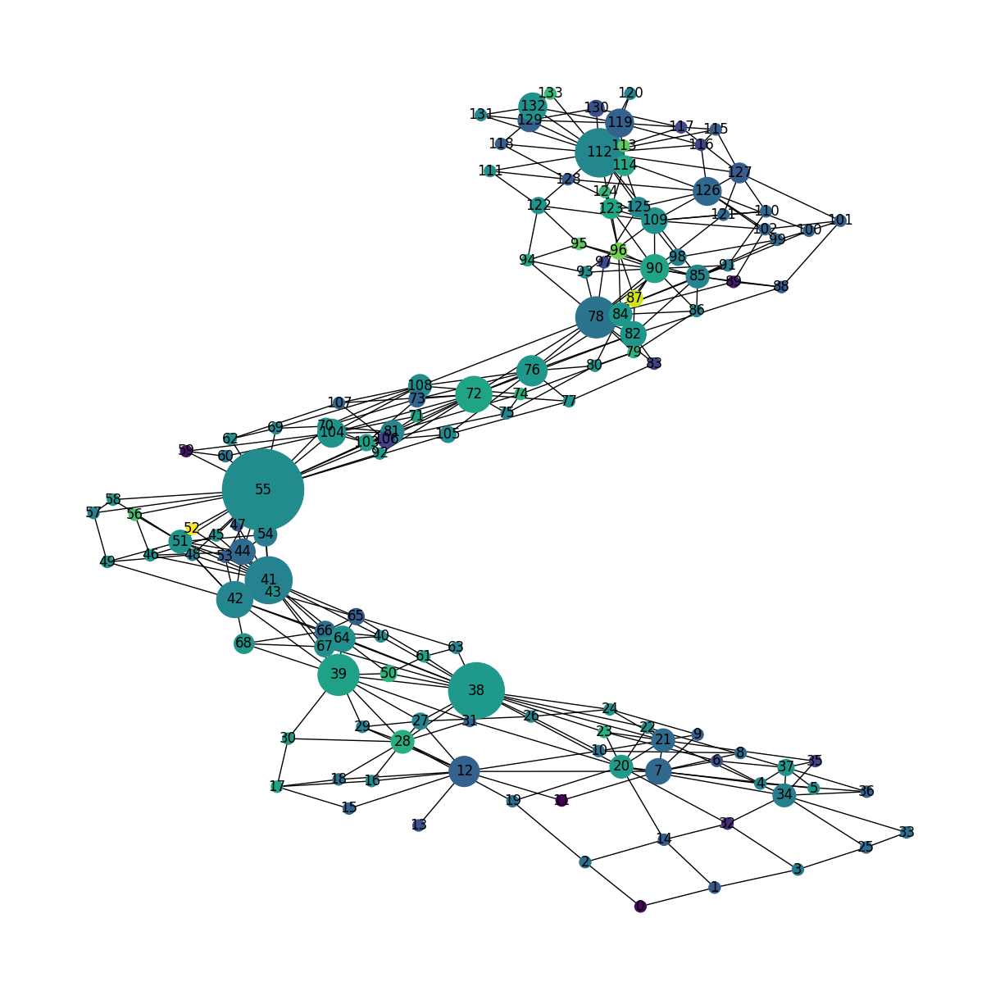

In [20]:
def create_node_dataframe(graph):
    node_data = graph.nodes(data=True)
    df_node = pd.DataFrame.from_records([{"Node": n, **d} for n, d in node_data])

    bet_cen = nx.betweenness_centrality(graph, weight='Resistance')
    deg_cen = nx.degree_centrality(graph)
    clo_cen = nx.closeness_centrality(graph, distance='Resistance')

    for u, v, d in graph.edges(data=True):
        d['weight'] = 1 / d['new_weight']

    try:
        eig_cen = nx.eigenvector_centrality(graph, weight='weight', max_iter=500)
    except PowerIterationFailedConvergence:
        print("Eigenvector centrality failed to converge. Setting values to None.")
        eig_cen = {node: None for node in graph.nodes()}

    # Adding a small constant to avoid division by zero
    reversed_weights = {node: 1/(data['weight'] + 0.0001) for node, data in graph.nodes(data=True)}
    try:
        # Set the damping factor to 0.85 and increase the maximum iterations
        pag_ran = nx.pagerank(graph, personalization=reversed_weights, alpha=0.85, max_iter=1000)
    except nx.PowerIterationFailedConvergence:
        print("PageRank failed to converge. Setting values to None.")
        pag_ran = {node: None for node in graph.nodes()}

    clus_cof = nx.clustering(graph)

    df_node['Betweenness'] = df_node['Node'].map(bet_cen)
    df_node['Degree'] = df_node['Node'].map(deg_cen)
    df_node['Closeness'] = df_node['Node'].map(clo_cen)
    df_node['Eigenvector'] = df_node['Node'].map(eig_cen)
    df_node['PageRank'] = df_node['Node'].map(pag_ran)
    df_node['Clustering'] = df_node['Node'].map(clus_cof)

    return df_node


# Now processing the new graph data and plotting
for i in range(len(new_all_graphs_nodes)):
    print(f"Processing modified graph {i+1}...")

    # You have to convert the DataFrame back to a graph for plotting and computations
    G = nx.from_pandas_edgelist(all_graphs_edges[i], 'Node1', 'Node2', edge_attr=True)

    # Add node attributes (must be done separately)
    node_attributes = new_all_graphs_nodes[i].set_index('Node').to_dict('index')
    nx.set_node_attributes(G, node_attributes)

    # Create DataFrame from graph again to include centrality measures, clustering, etc.
    df_node = create_node_dataframe(G)
    display(df_node)

    plt.figure(figsize=(12, 12))

    node_colors = [G.nodes[n]['weight'] for n in G.nodes()]
    node_sizes = [G.nodes[n]['num_nodes']*100 for n in G.nodes()]  # This assumes you want the node size to be proportional to weight

    nx.draw(G, with_labels=True, node_color=node_colors, node_size=node_sizes, cmap=plt.cm.viridis)

    plt.show()


In [181]:
import matplotlib
import networkx

print("Matplotlib version:", matplotlib.__version__)
print("NetworkX version:", networkx.__version__)


Matplotlib version: 3.7.1
NetworkX version: 2.8.4


In [30]:
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
import numpy as np
from matplotlib.colors import ListedColormap, Normalize
from networkx.exception import PowerIterationFailedConvergence
from matplotlib.cm import ScalarMappable

def draw_graph(graph):
    # Positions for all nodes - assume they are arranged in a 40x40 grid
    positions = dict((node, (int(node%40), int(node//40))) for node in graph.nodes())
    nx.set_node_attributes(graph, positions, 'pos')

    pos = nx.get_node_attributes(graph, 'pos')
    weights = nx.get_node_attributes(graph, 'weight')
    node_colors = [weights[n] for n in graph.nodes()]

    # Color map from 0 to 5 using viridis
    color_map = ScalarMappable(cmap='viridis', norm=Normalize(vmin=0, vmax=5))
    color_map.set_array([])

    plt.figure(figsize=(10, 10))
    nx.draw_networkx_nodes(graph, pos, node_color=node_colors, cmap='viridis', node_size=50, linewidths=0.5)
    nx.draw_networkx_edges(graph, pos, edge_color='gray', width=0.5)

    plt.colorbar(color_map)
    plt.show()

# test it
df_nodes = new_all_graphs_nodes  # assuming this dataframe is available and contains your node data
G = nx.from_pandas_edgelist(all_graphs_edges[i], 'Node1', 'Node2', edge_attr=True)  # assuming all_graphs_edges[i] is the corresponding edge dataframe

# Add node attributes (must be done separately)
node_attributes = df_nodes.to_dict('index')

nx.set_node_attributes(G, node_attributes)

draw_graph(G)


AttributeError: ignored